In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os,glob
import seaborn as sns
from open_ephys.analysis import Session

from pynwb import NWBHDF5IO, NWBFile
from pynwb.file import Subject

from datetime import datetime
from dateutil.tz import tzlocal

from jlh_ephys.analysis import Analysis
from jlh_ephys.utils import choose_stim_parameter, OE
from jlh_ephys.psth_raster import psth_arr 
#from jlh_ephys import spatial_tools as st  ## compatability issues maybe need to install from allensdk.core.mouse_connectivity_cache import MouseConnectivityCache in its own env 
from jlh_ephys.raw import find_artifact_start, align_data, raw_heatmap

from ccf_3D.tools import herbs_processing as hp
from ccf_3D.tools.metrics import distance

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

from scipy.ndimage import gaussian_filter1d

In [2]:
jlh31 = Analysis('jlh31', '2023-01-24') # all probes, many params and sites
jlh32 = Analysis('jlh32', '2023-02-18') # all probes, many params and sites
jlh33 = Analysis('jlh33', '2023-02-22') # probe B and C, many params and trains in diff recordings
jlh34 = Analysis('jlh34', '2023-05-15') # all 3 many params
jlh39 = Analysis('jlh39', '2023-08-16') # 3 probes for bi, no A for mono
jlh40 = Analysis('jlh40', '2023-08-21') # probeB and probe C only: monopolar -- with diff pulse width
jlh48 = Analysis('jlh48', '2024-11-05') # bb test, sorted only no bb portion (full bi and mono)
jlh49 = Analysis('jlh49v1', '2024-07-11') # bb test, just no bb portion (full bi only)
jlh53 = Analysis('jlh53concat', '2024-09-03') # regular, all 3 probes, probe A broke sometime. 

recordings = [jlh31, jlh32, jlh33, jlh34, jlh39, jlh40, jlh48, jlh49, jlh53]
slope_path = r"C:\Users\jordan\Documents\combined_figs\single_unit\unit_qual"
for r in recordings:
    r.get_brain_regs()
    r.get_electrode_coords()
    r.get_fs_rs(plot = False)
    slope_npy = glob.glob(os.path.join(slope_path, f'*{r.mouse}*'))[0]
    slope_outliers = np.load(slope_npy)
    r.units['slope_outlier'] = slope_outliers
    r.units['unit_id'] = r.units['probe'] + r.units['unit_id']
    

nn_contacts_labels = [6,11,3,14,1,16,2,15,5,12,4,13,7,10,8,9]

EP_path = r"C:\Users\jordan\Documents\combined_figs\evoked_potentials"

amp_alphas = {5: 0.3, 25: 0.5, 50: 0.7, 100: 1.0}
bipolar_color = '#82A69D'
cathodal_color = '#161943'
anodal_color = '#D99551'


c:\Users\jordan\AppData\Local\anaconda3\Lib\site-packages\hdmf\spec\namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."


NWB found. Trials and Units loaded


c:\Users\jordan\AppData\Local\anaconda3\Lib\site-packages\hdmf\spec\namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."


NWB found. Trials and Units loaded


c:\Users\jordan\AppData\Local\anaconda3\Lib\site-packages\hdmf\spec\namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."


NWB found. Trials and Units loaded


c:\Users\jordan\AppData\Local\anaconda3\Lib\site-packages\hdmf\spec\namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."


NWB found. Trials and Units loaded


c:\Users\jordan\AppData\Local\anaconda3\Lib\site-packages\hdmf\spec\namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."


NWB found. Trials and Units loaded


c:\Users\jordan\AppData\Local\anaconda3\Lib\site-packages\hdmf\spec\namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."


NWB found. Trials and Units loaded


c:\Users\jordan\AppData\Local\anaconda3\Lib\site-packages\hdmf\spec\namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."


NWB found. Trials and Units loaded


c:\Users\jordan\AppData\Local\anaconda3\Lib\site-packages\hdmf\spec\namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."


NWB found. Trials and Units loaded


c:\Users\jordan\AppData\Local\anaconda3\Lib\site-packages\hdmf\spec\namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
INFO:root:Final adjusted brain regions loaded
INFO:root:Final adjusted coordinates loaded


NWB found. Trials and Units loaded


INFO:root:Final adjusted brain regions loaded
INFO:root:Final adjusted coordinates loaded
INFO:root:Final adjusted brain regions loaded
INFO:root:Final adjusted coordinates loaded
INFO:root:Final adjusted brain regions loaded
INFO:root:Final adjusted coordinates loaded
INFO:root:Final adjusted brain regions loaded
INFO:root:Final adjusted coordinates loaded
INFO:root:Final adjusted brain regions loaded
INFO:root:Final adjusted coordinates loaded
INFO:root:Final adjusted brain regions loaded
INFO:root:Final adjusted coordinates loaded
INFO:root:Final adjusted brain regions loaded
INFO:root:Final adjusted coordinates loaded
INFO:root:Final adjusted brain regions loaded
INFO:root:Final adjusted coordinates loaded


# Figure 4a -- stacked raster examples

In [57]:
r.units.waveform_class.unique()

array(['fs', 'axon', 'up', 'rs'], dtype=object)

In [56]:
r.units.head()

,probe,unit_id,group,depth,xpos,ypos,no_spikes,firing_rate,KSlabel,KSamplitude,...,brain_reg,spike_times,waveform,waveform_duration,waveform_PTratio,waveform_repolarizationslope,waveform_class,slope_outlier,binned_rates,mean_rate
id,,,,,,,,,,,,,,,,,,,,,
0,A,A0,good,2460.0,59.0,40.0,14366,2.172245,good,904.0,...,"Superior colliculus, motor related, intermedia...","[-1797.4423333333314, -1794.6707000000106, -17...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000275,0.572794,1792.112959,fs,False,"[1.2833333333333334, 1.85, 1.6833333333333333,...",2.118879
1,A,A8,good,2460.0,27.0,40.0,65027,9.832562,good,2313.4,...,"Superior colliculus, motor related, intermedia...","[-1798.9864999999506, -1798.908599999939, -179...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000316,0.466068,1535.202742,fs,False,"[8.65, 6.483333333333333, 9.066666666666666, 1...",9.591003
2,A,A11,good,2460.0,59.0,40.0,48873,7.389958,good,3012.3,...,"Superior colliculus, motor related, intermedia...","[-1799.0330666667073, -1798.995133333321, -179...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000165,0.597226,2561.125970,fs,False,"[15.166666666666666, 15.766666666666667, 13.76...",7.208407
3,A,A13,good,2440.0,43.0,60.0,15093,2.282173,good,1153.8,...,"Superior colliculus, motor related, intermedia...","[-1798.8384666667287, -1796.4264666666206, -17...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000261,1.000000,821.141551,axon,False,"[0.4, 0.35, 0.35, 0.8, 1.1333333333333333, 1.4...",2.226106
4,A,A18,good,2420.0,59.0,80.0,82725,12.508630,good,1341.9,...,"Superior colliculus, motor related, intermedia...","[-1798.9669666666844, -1798.8315000000796, -17...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000206,0.269010,2752.494219,fs,False,"[12.5, 11.966666666666667, 13.116666666666667,...",12.201327


In [95]:
# for a single recording a stacked raster of all units
import matplotlib.ticker as mticker
def stacked_rasters(units_df, times, window_start=-0.01, window_end=0.02, 
                    color_by = 'brain_reg',
                    marker_size=1, c = 'blue', title = None, save = False, save_path = None):
    fig, ax1 = plt.subplots(figsize=(6, 6))
    #fig.patch.set_facecolor('white')
    #fig.patch.set_edgecolor('white')
    plot_spikes = []
    plot_units = []
    plot_colors = []
    

    if 'ccf_coordinates' in units_df.columns:
        # makes dv column from ccf coordinates (assumes ap, dv, ml structure) )
        units_df['dv'] = units_df['ccf_coordinates'].apply(lambda x: x[1] if isinstance(x, np.ndarray) and x.size > 1 else None)
        
        # for units with the same dv, provides an offset so they don't overlap
        grouped = units_df.groupby('dv')
        fraction_increment = 1 / (grouped['dv'].transform('count'))
        units_df['unique_dv'] = units_df['dv'] + fraction_increment * grouped.cumcount()
        units_df = units_df.sort_values(by = 'unique_dv')
        ccf = True
        ch = False
    else:
        # just uses channels if no DV
        grouped = units_df.groupby('ch')
        fraction_increment = 1 / (grouped['ch'].transform('count'))
        units_df['unique_ch'] = units_df['ch'] + fraction_increment * grouped.cumcount()
        units_df = units_df.sort_values(by = 'unique_ch')
        ch = True
        ccf = False

    brain_regions = units_df['brain_reg'].unique()
    if color_by == 'brain_reg':
        colors = plt.cm.viridis(np.linspace(0, 1, len(brain_regions)))
        color_map = dict(zip(brain_regions, colors))
    elif color_by == 'waveform_class':
        color_map = {
                    'fs': '#E8B820',
                    'rs': '#517383',
                    'axon': 'black',
                    'up': 'gray'
                    }

    # Plotting loop
    for _, unit in units_df.iterrows():
        spikes = np.array(unit['spike_times'])
        
        if ccf: y = unit['unique_dv']
        if ch: y = unit['unique_ch']

        if color_by == 'brain_reg':
            brain_region = unit['brain_reg']
            color = color_map[brain_region]
        elif color_by == 'waveform_class':
            waveform_class = unit['waveform_class'] 
            color = color_map[waveform_class]

        for trigger in times:
            relative_spikes = spikes - trigger
            spikes_in_window = relative_spikes[(relative_spikes >= window_start) & (relative_spikes <= window_end)]
            plot_spikes.extend(spikes_in_window)
            plot_units.extend([y] * len(spikes_in_window))
            plot_colors.extend([color] * len(spikes_in_window))

    ax1.scatter(plot_spikes, plot_units, c=plot_colors, s=marker_size, marker = '|')
    ax1.xaxis.set_major_formatter(
        mticker.FuncFormatter(lambda x, pos: f'{x*1e3:.0f}')  # seconds → ms
                            )
    ax1.set_xlabel('Time (ms)')
    tick_step_ms = 5                  # 5‑ms spacing
    ticks_s = np.arange(window_start*1e3,  # convert window to ms
                        window_end*1e3 + tick_step_ms,
                        tick_step_ms) / 1e3  # back to seconds for the axis
    ax1.set_xticks(ticks_s)
    ax1.set_ylabel('Depth (DV in CCF)')
    ax1.set_title(title)
    ax1.invert_yaxis()
    
    
    # create a secondary y-axis for brain region labels
    ax2 = ax1.twinx()
    ax2.set_ylim(ax1.get_ylim())  # ensure both y-axes have the same scale

    # determine positions for brain region labels
    for brain_region in brain_regions:
        median_dv = units_df[units_df['brain_reg'] == brain_region]['dv'].median()
        ax2.text(window_end + 0.001, median_dv, brain_region, verticalalignment='center', fontsize = 4)

    ax2.set_yticks([])  # Hide the y-ticks on the secondary axis
    
    plt.tight_layout()
    if save == True:
        plt.savefig(save_path+'.pdf', format='pdf', bbox_inches='tight', facecolor=fig.get_facecolor())
        #plt.savefig(save_path+'.png', format='png', bbox_inches='tight', facecolor=fig.get_facecolor())
    #plt.close()

# just a little specific tool for looping through and saving out stacked rasters for multiple conditions 
def create_mouse_save_path(base_dir, mouse, probe, polarity, amp, save_str, post):
    window = int(post*1000)
    save_dir = os.path.join(base_dir, mouse, f'probe{probe}', polarity, f'{str(amp)}ua,' f'{str(window)}ms_window')
    os.makedirs(save_dir, exist_ok=True)
    save_path = os.path.join(save_dir, f'{mouse}_probe{probe}_{save_str}_stacked_raster_{polarity}_amp{amp}_{window}ms')
    return save_path


    

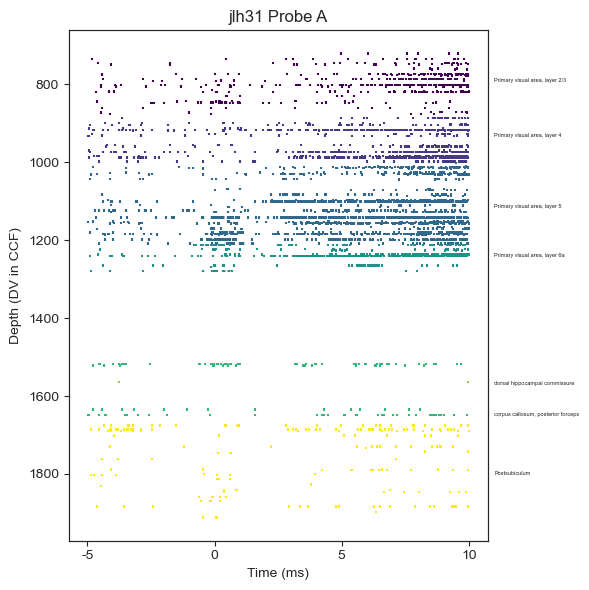

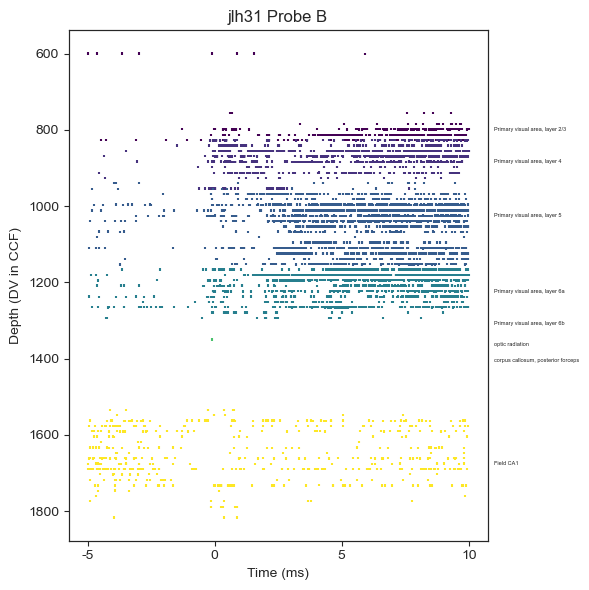

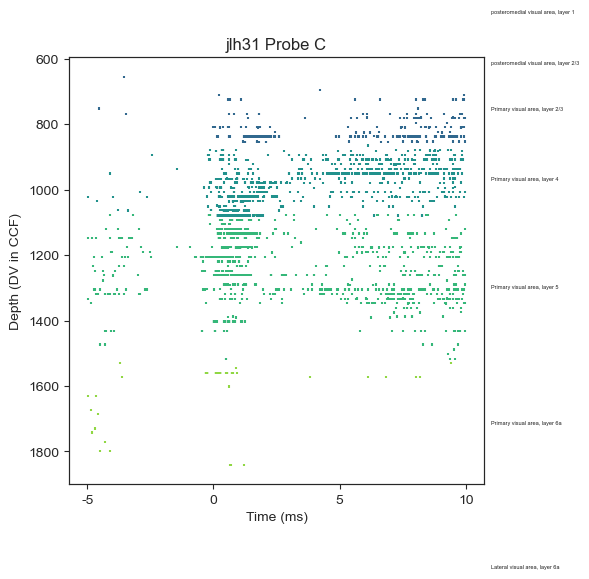

In [96]:
pre = -0.005 # 5 ms 
post = 0.01 # 10 ms

r = jlh31 # example 

units_A = r.units[(r.units.probe == 'A')].copy()
units_B = r.units[(r.units.probe == 'B')].copy()
units_C = r.units[(r.units.probe == 'C')].copy()

stim_times = choose_stim_parameter(r.trials, amp = -100, polarity = 'monopolar')

stacked_rasters(units_A, stim_times, window_start=pre, window_end=post, marker_size=3, 
                                        title= r.mouse + ' Probe A', save=False)

stacked_rasters(units_B, stim_times, window_start=pre, window_end=post, marker_size=3, 
                                        title= r.mouse + ' Probe B', save=False)
stacked_rasters(units_C, stim_times, window_start=pre, window_end=post, marker_size=3, 
                                        title= r.mouse + ' Probe C', save=False)

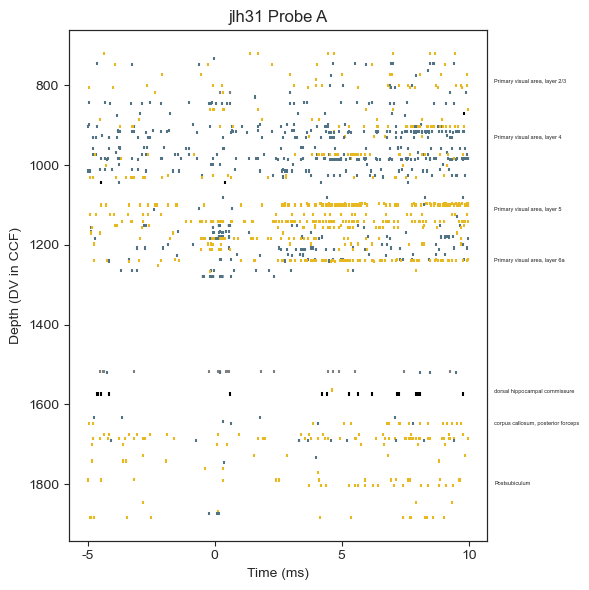

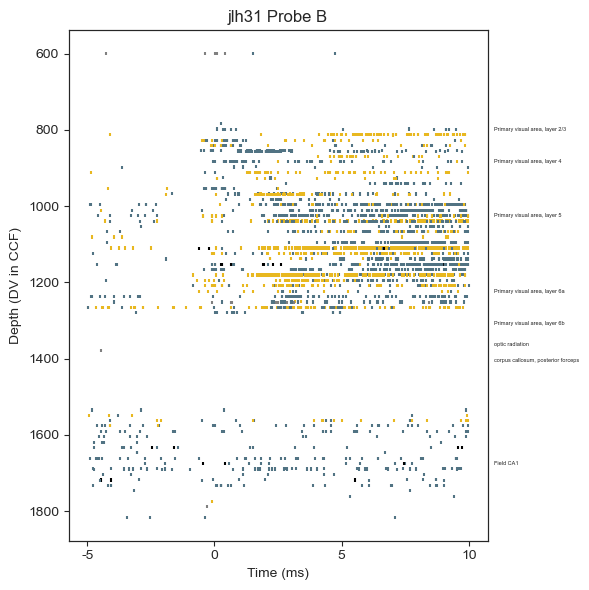

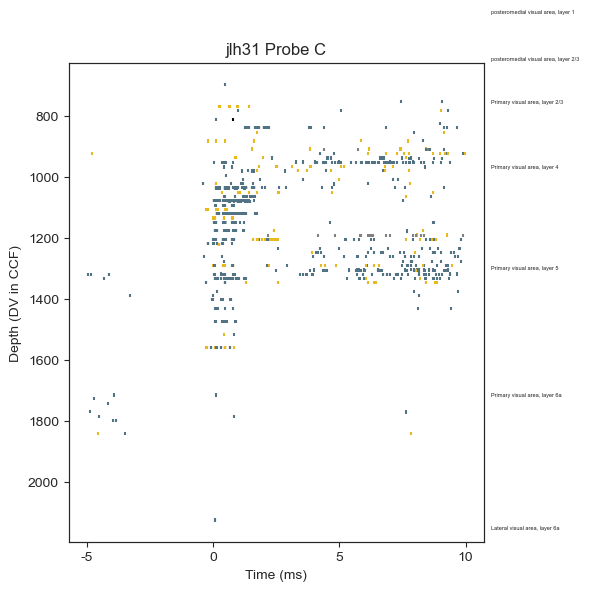

In [97]:
pre = -0.005 # 5 ms 
post = 0.01 # 10 ms

r = jlh31 # example 

units_A = r.units[(r.units.probe == 'A')].copy()
units_B = r.units[(r.units.probe == 'B')].copy()
units_C = r.units[(r.units.probe == 'C')].copy()

stim_times = choose_stim_parameter(r.trials, amp = -50, polarity = 'monopolar')[0:75]

stacked_rasters(units_A, stim_times, window_start=pre, window_end=post, 
                color_by = 'waveform_class', 
                marker_size=5, title= r.mouse + ' Probe A', save=False)

stacked_rasters(units_B, stim_times, window_start=pre, window_end=post, 
                color_by = 'waveform_class',
                marker_size=5, 
                title= r.mouse + ' Probe B', save=False)
stacked_rasters(units_C, stim_times, window_start=pre, window_end=post, 
                color_by = 'waveform_class',
                marker_size=5, 
                title= r.mouse + ' Probe C', save=False)

In [ ]:
def stacked_rasters_combined(combined_df, recordings, params, window_start=-0.01, window_end=0.02, 
                             color_by = 'brain_reg',
                             marker_size=0.2, title = None, save = None, 
                             save_path = None):
    
    fig, ax1 = plt.subplots(figsize=(6, 6))
    fig.patch.set_facecolor('white')
    fig.patch.set_edgecolor('white')
    
    plot_spikes = []
    plot_units = []
    plot_colors = []

    # Create a color map for brain regions

    
    combined_df['dv'] = combined_df['ccf_coordinates'].apply(lambda x: x[1] if isinstance(x, np.ndarray) and x.size > 1 else None)
    grouped = combined_df.groupby('dv')
    fraction_increment = 1 / (grouped['dv'].transform('count'))
    combined_df['unique_dv'] = combined_df['dv'] + fraction_increment * grouped.cumcount()
    combined_df = combined_df.sort_values(by = 'unique_dv')

    brain_regions = combined_df['brain_reg'].unique()
    if color_by == 'brain_reg':
        colors = plt.cm.viridis(np.linspace(0, 1, len(brain_regions)))
        color_map = dict(zip(brain_regions, colors))
    elif color_by == 'waveform_class':
        color_map = {
                    'fs': '#E8B820',
                    'rs': '#517383',
                    'axon': 'black',
                    'up': 'gray'
                    }
    # Plotting loop
    for r in recordings:
        units_df = combined_df.loc[combined_df.recording == r.mouse]
        times = choose_stim_parameter(r.trials, amp = params['amp'], pulse_number = params['pulse_number'], pulse_duration = params['pulse_duration'], polarity = params['polarity'])
        for _, unit in units_df.iterrows():
            spikes = np.array(unit['spike_times'])
            dv = unit['unique_dv']
            brain_region = unit['brain_reg']
            if color_by == 'brain_reg':
                color = color_map[brain_region]
            else:
                color = color_map[unit['waveform_class']]
            for trigger in times:
                relative_spikes = spikes - trigger
                spikes_in_window = relative_spikes[(relative_spikes >= window_start) & (relative_spikes <= window_end)]
                plot_spikes.extend(spikes_in_window)
                plot_units.extend([dv] * len(spikes_in_window))
                plot_colors.extend([color] * len(spikes_in_window))

    ax1.scatter(plot_spikes, plot_units, c=plot_colors, s=marker_size, marker = '|')
    ax1.set_xlabel('Time (s)')
    ax1.scatter(plot_spikes, plot_units, c=plot_colors, s=marker_size, marker = '|')
    ax1.xaxis.set_major_formatter(
        mticker.FuncFormatter(lambda x, pos: f'{x*1e3:.0f}')  # seconds → ms
                            )
    ax1.set_xlabel('Time (ms)')
    tick_step_ms = 5                  # 5‑ms spacing
    ticks_s = np.arange(window_start*1e3,  # convert window to ms
                        window_end*1e3 + tick_step_ms,
                        tick_step_ms) / 1e3  # back to seconds for the axis
    ax1.set_xticks(ticks_s)
    
    ax1.set_ylabel('Depth (DV in CCF)')
    
    
    ax1.set_title(title)
    ax1.invert_yaxis()
    # Create a secondary y-axis for brain region labels
    ax2 = ax1.twinx()
    ax2.set_ylim(ax1.get_ylim())  # Ensure both y-axes have the same scale

    # Determine positions for brain region labels
    for brain_region in brain_regions:
        median_dv = combined_df[combined_df['brain_reg'] == brain_region]['dv'].median()
        ax2.text(window_end + 0.001, median_dv, brain_region, 
                 verticalalignment='center', color = 'gray',
                 fontsize = 4) #color_map[brain_region])

    ax2.set_yticks([])  # Hide the y-ticks on the secondary axis
    plt.tight_layout()
    if save == True:
        plt.savefig(save_path+'.pdf')
        plt.savefig(save_path+'.png')

C:\Users\jordan\AppData\Local\Temp\ipykernel_134792\50431744.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  combined_df['dv'] = combined_df['ccf_coordinates'].apply(lambda x: x[1] if isinstance(x, np.ndarray) and x.size > 1 else None)
C:\Users\jordan\AppData\Local\Temp\ipykernel_134792\50431744.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  combined_df['unique_dv'] = combined_df['dv'] + fraction_increment * grouped.cumcount()


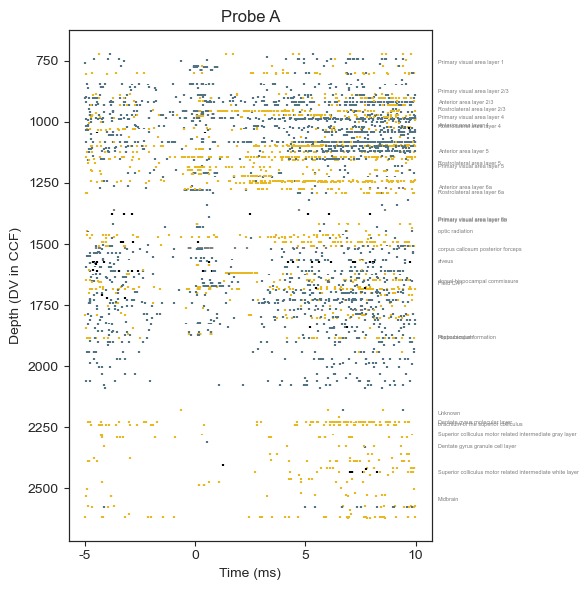

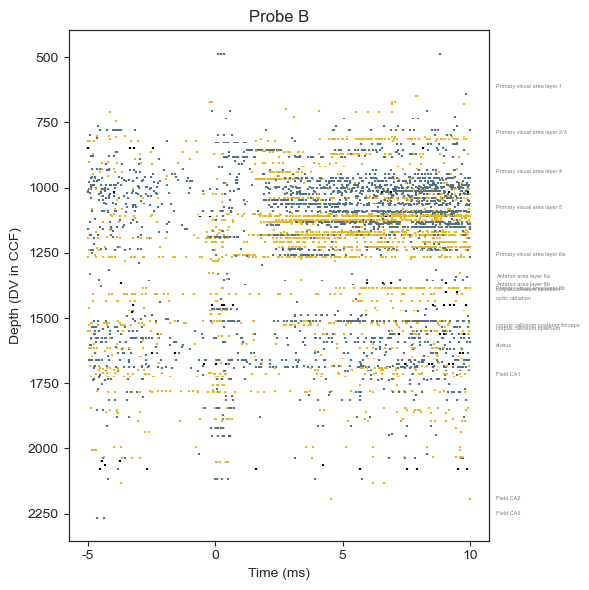

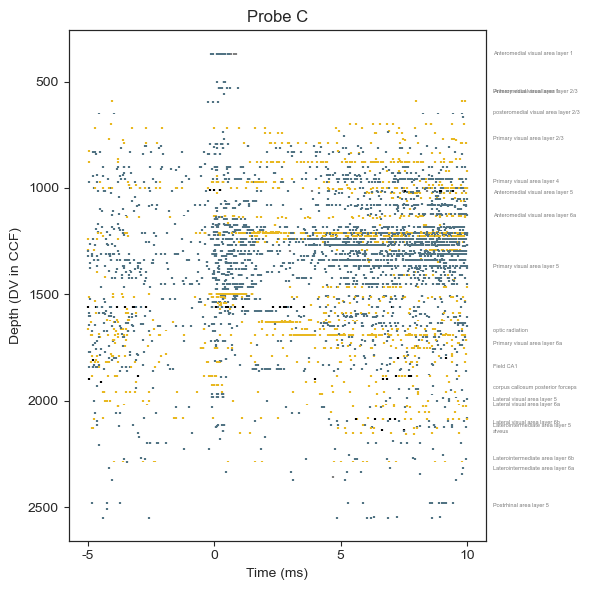

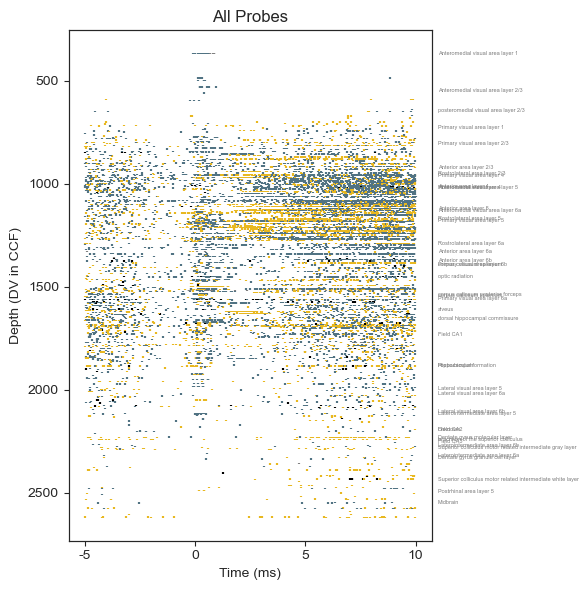

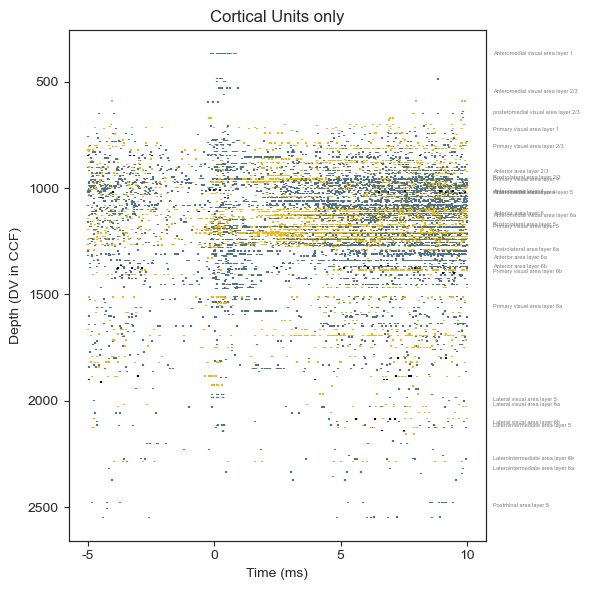

In [105]:
for r in recordings:
    r.units['recording'] = r.mouse

concat_units = pd.concat([r.units for r in recordings]).reset_index()
concat_units['brain_reg'] = concat_units['brain_reg'].str.replace(',', '')


concat_units_A = concat_units.loc[concat_units.probe == 'A'].loc[concat_units.group == 'good'].copy()
concat_units_B = concat_units.loc[concat_units.probe == 'B'].loc[concat_units.group == 'good'].copy()
concat_units_C = concat_units.loc[concat_units.probe == 'C'].loc[concat_units.group == 'good'].copy()
concat_units_good = concat_units.loc[concat_units.group == 'good'].copy()

mask = concat_units_good['brain_reg'].str.contains('area', case=False, na=False)
concat_units_cortical = concat_units_good.loc[mask]

amp = -50
polarity = 'monopolar'

params = {'amp': amp, 'pulse_number': 1, 'pulse_duration': 100, 'polarity': polarity}

stacked_rasters_folder = r"C:\Users\jordan\Documents\combined_figs\single_units\stacked_rasters\waveform_class"
os.makedirs(stacked_rasters_folder, exist_ok=True)
stacked_rasters_combined(concat_units_A, recordings, params, window_start=pre, window_end=post, 
                        color_by = 'waveform_class', 
                        marker_size= 2, 
                        title='Probe A', save=False,
                        save_path = os.path.join(stacked_rasters_folder, 
                                                 f'allrecordings_probeA_{polarity}_{amp}ua_{int(post*1000)}ms_window'))

stacked_rasters_combined(concat_units_B, recordings, params, window_start=pre, window_end=post,
                        color_by = 'waveform_class', 
                        marker_size= 2, 
                        title='Probe B', save=False,
                        save_path = os.path.join(stacked_rasters_folder,
                                                 f'allrecordings_probeB_{polarity}_{amp}ua_{int(post*1000)}ms_window'))
stacked_rasters_combined(concat_units_C, recordings, params, window_start=pre, window_end=post,
                        color_by = 'waveform_class',
                        marker_size= 2, 
                        title='Probe C', save=False,
                        save_path = os.path.join(stacked_rasters_folder,
                                                 f'allrecordings_probeC_{polarity}_{amp}ua_{int(post*1000)}ms_window'))

stacked_rasters_combined(concat_units_good, recordings, params, window_start=pre, window_end=post,
                        color_by = 'waveform_class',
                        marker_size = 1, 
                        title='All Probes', save=False,
                        save_path = os.path.join(stacked_rasters_folder,
                                                 f'allrecordings_allprobes_{polarity}_{amp}ua_{int(post*1000)}ms_window'))

stacked_rasters_combined(concat_units_cortical, recordings, params, window_start=pre, window_end=post,
                        color_by = 'waveform_class',
                        marker_size = 1,
                        title='Cortical Units only', save=False,
                        save_path = os.path.join(stacked_rasters_folder,
                                                 f'allrecordings_cortical_{polarity}_{amp}ua_{int(post*1000)}ms_window'))


# Figure 4c -- example single unit rasters

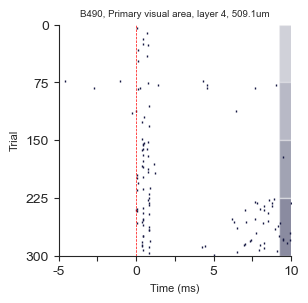

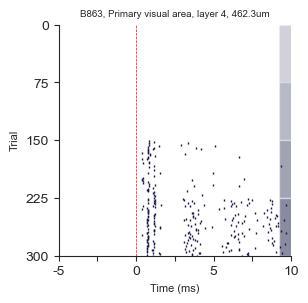

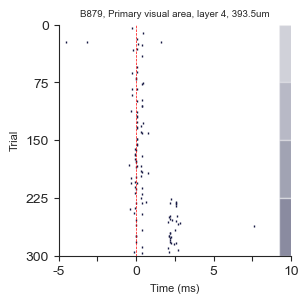

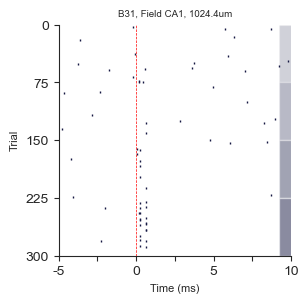

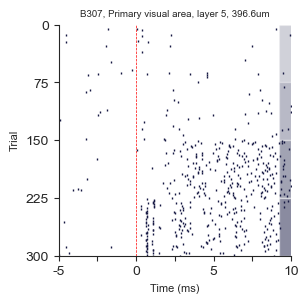

...

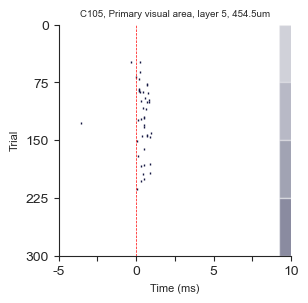

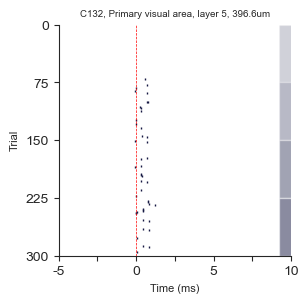

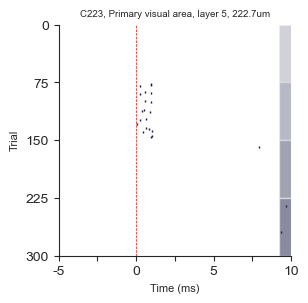

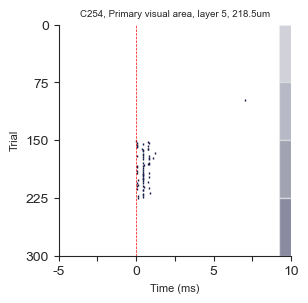

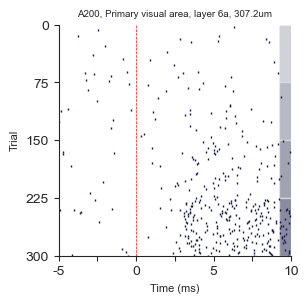

In [5]:
from jlh_ephys.plotter import raster

pre = 0.005
post = 0.01

r = jlh31
for unit_id in ['B490', "B863", "B879", "B31", "B307", "B873", "C105", "C132", "C223", "C254", "A200"]:
    
    # unit details 
    unit_row = r.units[r.units.unit_id == unit_id]
    spike_times = unit_row.spike_times.values[0]
    unit_ccf = unit_row.ccf_coordinates.values[0]
    unit_brain_reg = unit_row.brain_reg.values[0]
    
    
    stim_times_5 = choose_stim_parameter(r.trials, amp = -5, pulse_duration = 100, polarity = 'monopolar')
    stim_times_25 = choose_stim_parameter(r.trials, amp = -25, pulse_duration = 100, polarity = 'monopolar')[0:75]
    stim_times_50 = choose_stim_parameter(r.trials, amp = -50, pulse_duration = 100, polarity = 'monopolar')[0:75]
    stim_times_100 = choose_stim_parameter(r.trials, amp = -100, pulse_duration = 100, polarity = 'monopolar')[0:75]
    #buffer = np.zeros(10)

    stim_times = np.concatenate([stim_times_5, stim_times_25, stim_times_50, stim_times_100])
    stim_contact_ccf = r.trials.contact_negative_coords.values[0]
    
    
    distance_from_stim = np.linalg.norm(unit_ccf - stim_contact_ccf) # distance in microns
    
    fig, ax = plt.subplots(figsize = (3,3))
    raster(spike_times, stim_times, pre = pre, post = post, 
        color = cathodal_color, linewidth = 0.6, labelsize = 8, 
        axis_labelsize = 10, marker = '|', marker_size = 2,
        axes = ax)

    
    #xlabels = [-5, 0, 5, 10]#np.round(np.linspace(-pre, post, 5) * 1000, 1)
    #xlabels = xlabels.astype(int)
    #ax.set_xticklabels(xlabels)
    
    num_trials  = len(stim_times)
    chunk_size  = 75                 # change if you ever use a different batch size
    base_alpha  = 0.2               # starting transparency
    alpha_step  = 0.1               # how much darker each block gets
    
    ax.set_xticks(np.linspace(-pre, post, 7), ['-5', '', '0', '', '5', '', '10'])

    for i, start in enumerate(range(0, num_trials, chunk_size)):
        end   = start + chunk_size
        shade = base_alpha + i * alpha_step
        ax.axhspan(start,   # a little padding so the band lines up
                end,
                xmin = 0.95,
                xmax = 1.1,
                facecolor=cathodal_color,
                alpha=shade,
                zorder=0)     
    
    ax.set_title(f'{unit_id}, {unit_brain_reg}, {distance_from_stim:.1f}um', fontsize = 7)
    ax.set_yticks([0, 75, 150, 225, 300])
    save_folder = r"C:\Users\jordan\Documents\combined_figs\single_unit\selected_rasters\jlh31"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    #fig.savefig(os.path.join(save_folder, f'{unit_id}_cathodal_raster.pdf'))
    #fig.savefig(os.path.join(save_folder, f'{unit_id}_cathodal_raster.png'))

In [66]:
from jlh_ephys.plotter import raster
from tqdm.notebook import tqdm
pre = 0.005
post = 0.01

for r in tqdm(recordings, desc='Processing recordings'):
    good_units = r.units[(r.units.group == 'good') & (r.units.slope_outlier == False)]
    
    for i, unit_row in good_units.iterrows():
        
        # unit details 
        unit_id = unit_row.unit_id
        spike_times = unit_row.spike_times
        unit_ccf = unit_row.ccf_coordinates
        unit_brain_reg = unit_row.brain_reg
        
        
        stim_times_5c = choose_stim_parameter(r.trials, amp = -5, pulse_duration = 100, polarity = 'monopolar')[0:75]
        stim_times_25c = choose_stim_parameter(r.trials, amp = -25, pulse_duration = 100, polarity = 'monopolar')[0:75]
        stim_times_50c = choose_stim_parameter(r.trials, amp = -50, pulse_duration = 100, polarity = 'monopolar')[0:75]
        stim_times_100c = choose_stim_parameter(r.trials, amp = -100, pulse_duration = 100, polarity = 'monopolar')[0:75]
    

        stim_times_5a = choose_stim_parameter(r.trials, amp = 5, pulse_duration = 100, polarity = 'monopolar')[0:75]
        stim_times_25a = choose_stim_parameter(r.trials, amp = 25, pulse_duration = 100, polarity = 'monopolar')[0:75]
        stim_times_50a = choose_stim_parameter(r.trials, amp = 50, pulse_duration = 100, polarity = 'monopolar')[0:75]
        stim_times_100a = choose_stim_parameter(r.trials, amp = 100, pulse_duration = 100, polarity = 'monopolar')[0:75]
        
        stim_times_5b = choose_stim_parameter(r.trials, amp = -5, pulse_duration = 100, polarity = 'bipolar')[0:75]
        stim_times_25b = choose_stim_parameter(r.trials, amp = -25, pulse_duration = 100, polarity = 'bipolar')[0:75]
        stim_times_50b = choose_stim_parameter(r.trials, amp = -50, pulse_duration = 100, polarity = 'bipolar')[0:75]
        stim_times_100b = choose_stim_parameter(r.trials, amp = -100, pulse_duration = 100, polarity = 'bipolar')[0:75]
    
        buffer = np.zeros(75*4)

        stim_timesc = np.concatenate([stim_times_5c, stim_times_25c, stim_times_50c, stim_times_100c, buffer, buffer])
        stim_timesa = np.concatenate([buffer, stim_times_5a, stim_times_25a, stim_times_50a, stim_times_100a, buffer])
        stim_timesb = np.concatenate([buffer, buffer, stim_times_5b, stim_times_25b, stim_times_50b, stim_times_100b])
        
        stim_contact_ccf = r.trials.contact_negative_coords.values[0]
        
        
        distance_from_stim = np.linalg.norm(unit_ccf - stim_contact_ccf) # distance in microns
        
        fig, ax = plt.subplots(figsize = (3,3))
        
        # raster for cathodal
        raster(spike_times, stim_timesc, pre = pre, post = post, 
            color = cathodal_color, linewidth = 0.6, labelsize = 8, 
            axis_labelsize = 10, marker = '|', marker_size = 2,
            axes = ax)
        
        # raster for anodal
        raster(spike_times, stim_timesa, pre = pre, post = post, 
            color = anodal_color, linewidth = 0.6, labelsize = 8, 
            axis_labelsize = 10, marker = '|', marker_size = 2,
            axes = ax)
        
        # raster for bipolar 
        raster(spike_times, stim_timesb, pre = pre, post = post, 
            color = bipolar_color, linewidth = 0.6, labelsize = 8, 
            axis_labelsize = 10, marker = '|', marker_size = 2,
            axes = ax)
        
        #xlabels = [-5, 0, 5, 10]#np.round(np.linspace(-pre, post, 5) * 1000, 1)
        #xlabels = xlabels.astype(int)
        #ax.set_xticklabels(xlabels)
        ax.set_xticks(np.linspace(-pre, post, 7), ['-5', '', '0', '', '5', '', '10'])
        
        
        # cathodal shading 
        num_trials  = 75*4
        start = 0
        end = num_trials + start 
        chunk_size  = 75                 # change if you ever use a different batch size
        base_alpha  = 0.2               # starting transparency
        alpha_step  = 0.1               # how much darker each block gets
        
        for i, start in enumerate(range(0, num_trials, chunk_size)):
            end   = start + chunk_size
            shade = base_alpha + i * alpha_step
            ax.axhspan(start,  
                    end,
                    xmin = 0.95,
                    xmax = 1.0,
                    facecolor=cathodal_color,
                    alpha=shade,
                    zorder=0)     
        
        # anodal shading 
        num_trials  = 75*4
        start = 75*4
        end = num_trials + start
        for i, start in enumerate(range(75*4, num_trials + 75*4, chunk_size)):
            end   = start + chunk_size
            shade = base_alpha + i * alpha_step
            ax.axhspan(start,  
                    end,
                    xmin = 0.95,
                    xmax = 1.0,
                    facecolor=anodal_color,
                    alpha=shade,
                    zorder=0)
            
        # bipolar shading
        num_trials  = 75*4
        start = 75*4 * 2
        end = num_trials + start
        for i, start in enumerate(range(75*4 * 2, num_trials + 75*4 * 2, chunk_size)):
            end   = start + chunk_size
            shade = base_alpha + i * alpha_step
            ax.axhspan(start,   
                    end,
                    xmin = 0.95,
                    xmax = 1.0,
                    facecolor=bipolar_color,
                    alpha=shade,
                    zorder=0)
            
        ax.set_title(f'{unit_id}, {unit_brain_reg}, {distance_from_stim:.1f}um', fontsize = 7)
        ax.set_yticks([0, 75, 150, 225, 300, 375, 450, 525, 600, 675, 750, 825, 900],
                    [0, '', '', '', 300, '', '', '', 600, '', '', '', 900])
        
        save_folder = fr"C:\Users\jordan\Documents\combined_figs\single_unit\polarity_amp_rasters\{r.mouse}\10ms"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)
        plt.savefig(os.path.join(save_folder, f'{unit_id}_raster.pdf'))
        plt.savefig(os.path.join(save_folder, f'{unit_id}_raster.png'))
        plt.close()

Processing recordings:   0%|          | 0/9 [00:00<?, ?it/s]

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 86,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 8

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 8

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 70, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 86, 87, 88]
IN

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 86,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 8

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 70, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 70, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 8

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 70, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 55, 68, 70, 72, 73, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 8

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 86,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fontTools.subse

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 8

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 8

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 70, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 8

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 70, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 8

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 8

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 70, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88]


These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 8

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88]

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88]

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 55, 68, 70, 71, 72, 76, 79, 8

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'b', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 69, 72, 76, 79, 80, 85, 86

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fontTools.subse

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 7

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 47, 55, 68, 72, 76, 79, 8

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87, 88, 89, 92

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fontTools.subse

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fontTools.subse

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 27, 28, 38, 55, 68, 71, 72, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fontTools.subse

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 8

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontToo

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 8

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 37, 55, 68, 70, 72, 73, 7

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fontTools.subse

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTools

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTools

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 38, 41, 55, 68, 71, 72, 76, 79

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 38, 41, 55, 68, 71, 72, 76, 79, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 38, 41, 55, 68, 71, 72, 76, 79, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 8

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88]
INFO:fon

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88]
INFO:fo

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]


These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTool

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]


These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 27 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTools.subset:Clo

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 26 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 38, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTools.subset:Closed glyph lis

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 55, 68, 70, 72, 73, 7

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 55, 68, 7

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86, 87, 88]
IN

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86, 87, 88]
IN

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86, 87, 88]
IN

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 55, 68, 70, 72, 73, 7

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 35 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 55, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 55, 68, 70, 71, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 55, 68, 70, 71, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 55, 68, 70, 71, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 55, 68, 70, 71, 72, 76, 79, 8

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 55, 68, 70, 71, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 55, 68, 70, 71, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 55, 68, 70, 71, 72, 76, 79, 8

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 35 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 55, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 55, 68, 70, 71, 7

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 55, 68, 70, 71, 72, 76, 79, 8

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 35 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 55, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 35 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 55, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 38, 55, 68, 71, 72, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 38, 55, 68, 71, 72, 7

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 35 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 55,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 28, 38, 55, 68, 71, 72, 76, 79, 80, 8

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 35 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 55, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 36 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88]
INFO:fon

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 55, 68, 70, 71, 7

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 55, 68, 70, 71, 7

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 36 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88]
INFO:fo

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 27 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTools.subset:Clos

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 55, 68, 70, 72, 73, 7

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 55, 68, 70, 72, 73, 

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 55, 68, 70, 71,

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 55, 68, 70, 72, 73, 7

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 55, 68, 70, 72, 73, 7

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 55, 68, 70, 72, 73, 7

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5
These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 35 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'C', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 36, 38, 55, 68,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 8

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 8

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 8

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 8

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 86,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 86, 87, 88]
IN

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 8

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 70, 7

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 8

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 70, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 8

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 8

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 86

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 76, 79, 80, 81, 82, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 8

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80, 82, 85, 86, 87, 88]
IN

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 55, 68, 70, 71, 72, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88]

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88]

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 27 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 37, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTools.subset:Close

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTools

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 27 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 37, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTools.subset:Clo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 55, 68, 7

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 37, 55, 68, 70, 72, 73, 7

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 8

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 55, 68, 70, 72, 73, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 37, 55, 68, 70, 72, 73, 7

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 55, 68, 7

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 55, 68, 70, 71, 72, 76, 79,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 55, 68, 70, 71, 72, 76, 79, 8

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 37, 55, 68, 70, 71, 72, 76, 79, 80, 81, 82, 83

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'b', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 51, 55, 68, 69, 72, 76, 79, 80, 85, 86,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'b', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 37, 51, 55, 68, 69, 72, 76, 79, 80, 85, 86, 88, 89, 92]


These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'b', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 69, 72, 76, 79,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88]

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 27 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 37, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTools.subset:Close

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTool

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 27 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 37, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTools.subset:Clos

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 27 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 37, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTools.subset:Clos

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTool

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 55, 68, 7

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 55, 68, 70, 72, 73, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 55, 68, 70, 71, 72, 76, 79, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 55, 68, 70, 72, 73, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 55, 68, 70, 72, 73, 76, 79, 80, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fontTools.subse

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fontTools.subse

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fontTools.subse

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fontTools.subse

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:font

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15
These are the multiple unique cathodal [15 11]
Returning the first one: 15


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 54, 55, 6

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 54, 55, 6

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 54, 55, 6

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 54, 55, 6

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 38 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 38 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 38 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 38 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 39 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 38 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 38 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 3

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 39 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 54, 55, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 54, 55, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 54, 55, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 54, 55,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 54, 55, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 38 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 3

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 54, 55, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 54, 55, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 54, 55, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 54, 55, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 36 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 54, 55, 68, 70, 71, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 36 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 54, 55, 68, 70, 71, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 36 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 54, 55, 68, 70, 71, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 54, 55,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'g', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 54

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'g', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 54

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'g', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'g', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 54

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 69, 70, 72, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 55, 68, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 55, 68, 70, 71, 72, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 55, 68, 70, 71, 72, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 55, 68, 70, 71, 72, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 55, 68, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 55, 68, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 55, 68, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85, 86, 88]
IN

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85, 86, 88]
IN

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86, 87, 88]
IN

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86, 87, 88]
IN

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86, 87, 88]
IN

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 55, 68, 70, 72, 73, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86, 87, 88]
IN

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86, 87, 88]
IN

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 55, 68, 70, 72, 73, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 72, 73, 76

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 76, 79, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 76, 79, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 76, 79, 80, 81, 82, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 76, 79, 80, 81, 82, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 76, 79, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 55, 68, 70, 71,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 76, 79, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 76, 79, 80, 81, 82, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 76, 79, 80, 81, 82, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 72, 76, 79, 80, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 55, 68, 70, 71,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 72, 76, 79, 80, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 72, 76, 79,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 72, 76, 79, 80, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 72, 76, 79, 80, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 69, 72, 76, 79, 80, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'b', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 69, 72, 76, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fontTools.subse

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 51, 55

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 38 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 38 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'S', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 36, 55, 68, 70, 71, 72, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 55, 68, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85, 86, 88]
IN

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85, 86, 88]
IN

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'eight', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86, 87, 88]
IN

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 55, 68, 70, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 76, 79, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 51, 55, 68, 72, 76

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 55, 68, 70, 71, 72, 75

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'e', 'f', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 36, 55, 68, 70, 72, 73, 76, 79, 80, 82, 83, 85, 86, 87, 88]
IN

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 55, 68, 70, 71, 72, 75, 76, 79, 80, 82, 83, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88]


These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88]

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88]

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88]


These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTools

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 37, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89]
INFO:fontTools

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 55, 68, 70, 72, 76, 79, 80, 81, 82, 83

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 37, 55, 68, 70, 72, 76, 79, 80, 81, 82, 83, 85, 86, 88]
INFO:fontTo

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 37, 55, 68, 70, 71, 72, 76, 79, 80, 81, 82, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'T', 'a', 'b', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 37, 55, 68, 69, 72, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'T', 'a', 'b', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 37, 55, 68, 69, 72, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'T', 'a', 'b', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 37, 55, 68, 69, 72, 76, 79,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'T', 'a', 'b', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 37, 55, 68, 69, 72, 76, 79,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'T', 'a', 'b', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 36, 37, 55, 68, 69, 72, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fo

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fontTools.subse

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 28 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fontTools.subse

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 29 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 92]
INFO:fon

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'T', 'a', 'c', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 55, 68, 70, 71,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'B', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 37, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 41, 55

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'A', 'B', 'C', 'F', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'u', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 27, 28, 36, 37, 38, 41, 55, 68, 71, 72, 76, 79, 80, 85, 86, 88

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 75, 76, 79, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 75, 76, 79, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 51, 55, 68, 72, 75, 76, 79, 80, 81, 82, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 75, 76, 79, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 35 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 51, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 47, 55, 68, 71, 72, 76, 79,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'd', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 47, 55, 68, 71, 72, 76, 79, 80, 81, 82, 85

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 47, 55, 68, 71, 72, 76, 79, 80, 81, 82, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 47, 55, 68, 71,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'd', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 28, 38, 47, 55, 68, 71, 72, 76, 79, 80, 81, 82, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 47, 55, 68, 71,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'd', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 38, 47, 55, 68, 71,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 8

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87, 88, 89, 92

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87, 88, 89, 92]


These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 47, 55, 68, 72, 76, 79, 80,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 47, 55, 68, 72, 76, 79, 80,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 47, 55, 68, 72

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 47, 55, 68, 72, 76, 79, 80,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 47, 55, 68, 72

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38, 47, 55, 68, 72

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 27, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 47, 55, 68, 72, 76, 79, 80

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 86, 88, 89, 9

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 76,

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 38, 51, 55, 68, 72, 76, 79, 80, 85, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 'three', 'two', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 38, 51, 55, 68, 72, 76

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 34 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 38, 51, 55, 68, 72, 7

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 33 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'P', 'T', 'a', 'comma', 'e', 'five', 'four', 'glyph00001', 'glyph00002', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 26, 28, 38, 51, 55, 68, 72, 75, 76, 79, 

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 30 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'five', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 24, 25, 26, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87, 88, 89, 92

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16  4]
Returning the first one: 16


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:meta dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', 'C', 'L', 'T', 'a', 'comma', 'e', 'eight', 'five', 'four', 'glyph00001', 'glyph00002', 'hyphen', 'i', 'l', 'm', 'nine', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 17, 19, 20, 22, 23, 24, 25, 27, 28, 38, 47, 55, 68, 72, 76, 79, 80, 85, 86, 87

# Figure 4d -- first spike latencies

In [6]:
from tqdm.notebook import tqdm
from scipy.stats import truncnorm


max_lat = 0.5
polarity_settings = [
    ('cathodal', [-5, -25, -50, -100], 'monopolar', 0, cathodal_color),
    ('anodal',   [5, 25, 50, 100],     'monopolar', 1, anodal_color),
    ('bipolar',  [-5, -25, -50, -100],     'bipolar',   2, bipolar_color),
]


# Create empty structure for latencies per condition
latencies_by_pol_amp = {pol: {amp: [] for amp in amps} for pol, amps, *_ in polarity_settings}

# Compute latencies by polarity and amplitude
for pol, amps, poltype, _, _ in polarity_settings:
    for amp in amps:
        for r in tqdm(recordings, desc=f'Recordings ({pol} {amp})'):
            stim_times = choose_stim_parameter(r.trials, amp=amp, polarity=poltype)
            good_units = r.units[r.units['group'] == 'good']
            for i, unit in tqdm(good_units.iterrows(), total=len(good_units), desc='Units', leave=False):
                spike_times = np.array(unit['spike_times'])
                for t in stim_times:
                    post_spikes = spike_times[(spike_times >= t) & (spike_times < t + max_lat)]
                    if len(post_spikes) > 0:
                        latency = post_spikes[0] - t
                        latencies_by_pol_amp[pol][amp].append(latency * 1000)  # convert to ms


Recordings (cathodal -5):   0%|          | 0/9 [00:00<?, ?it/s]

Units:   0%|          | 0/409 [00:00<?, ?it/s]

Units:   0%|          | 0/403 [00:00<?, ?it/s]

Units:   0%|          | 0/175 [00:00<?, ?it/s]

Units:   0%|          | 0/263 [00:00<?, ?it/s]

Units:   0%|          | 0/209 [00:00<?, ?it/s]

Units:   0%|          | 0/200 [00:00<?, ?it/s]

Units:   0%|          | 0/321 [00:00<?, ?it/s]

Units:   0%|          | 0/459 [00:00<?, ?it/s]

Units:   0%|          | 0/391 [00:00<?, ?it/s]

Recordings (cathodal -25):   0%|          | 0/9 [00:00<?, ?it/s]

Units:   0%|          | 0/409 [00:00<?, ?it/s]

Units:   0%|          | 0/403 [00:00<?, ?it/s]

Units:   0%|          | 0/175 [00:00<?, ?it/s]

Units:   0%|          | 0/263 [00:00<?, ?it/s]

Units:   0%|          | 0/209 [00:00<?, ?it/s]

Units:   0%|          | 0/200 [00:00<?, ?it/s]

Units:   0%|          | 0/321 [00:00<?, ?it/s]

Units:   0%|          | 0/459 [00:00<?, ?it/s]

Units:   0%|          | 0/391 [00:00<?, ?it/s]

Recordings (cathodal -50):   0%|          | 0/9 [00:00<?, ?it/s]

Units:   0%|          | 0/409 [00:00<?, ?it/s]

Units:   0%|          | 0/403 [00:00<?, ?it/s]

Units:   0%|          | 0/175 [00:00<?, ?it/s]

Units:   0%|          | 0/263 [00:00<?, ?it/s]

Units:   0%|          | 0/209 [00:00<?, ?it/s]

Units:   0%|          | 0/200 [00:00<?, ?it/s]

Units:   0%|          | 0/321 [00:00<?, ?it/s]

Units:   0%|          | 0/459 [00:00<?, ?it/s]

Units:   0%|          | 0/391 [00:00<?, ?it/s]

Recordings (cathodal -100):   0%|          | 0/9 [00:00<?, ?it/s]

Units:   0%|          | 0/409 [00:00<?, ?it/s]

Units:   0%|          | 0/403 [00:00<?, ?it/s]

Units:   0%|          | 0/175 [00:00<?, ?it/s]

Units:   0%|          | 0/263 [00:00<?, ?it/s]

Units:   0%|          | 0/209 [00:00<?, ?it/s]

Units:   0%|          | 0/200 [00:00<?, ?it/s]

Units:   0%|          | 0/321 [00:00<?, ?it/s]

Units:   0%|          | 0/459 [00:00<?, ?it/s]

Units:   0%|          | 0/391 [00:00<?, ?it/s]

Recordings (anodal 5):   0%|          | 0/9 [00:00<?, ?it/s]

Units:   0%|          | 0/409 [00:00<?, ?it/s]

Units:   0%|          | 0/403 [00:00<?, ?it/s]

Units:   0%|          | 0/175 [00:00<?, ?it/s]

Units:   0%|          | 0/263 [00:00<?, ?it/s]

Units:   0%|          | 0/209 [00:00<?, ?it/s]

Units:   0%|          | 0/200 [00:00<?, ?it/s]

Units:   0%|          | 0/321 [00:00<?, ?it/s]

Units:   0%|          | 0/459 [00:00<?, ?it/s]

Units:   0%|          | 0/391 [00:00<?, ?it/s]

Recordings (anodal 25):   0%|          | 0/9 [00:00<?, ?it/s]

Units:   0%|          | 0/409 [00:00<?, ?it/s]

Units:   0%|          | 0/403 [00:00<?, ?it/s]

Units:   0%|          | 0/175 [00:00<?, ?it/s]

Units:   0%|          | 0/263 [00:00<?, ?it/s]

Units:   0%|          | 0/209 [00:00<?, ?it/s]

Units:   0%|          | 0/200 [00:00<?, ?it/s]

Units:   0%|          | 0/321 [00:00<?, ?it/s]

Units:   0%|          | 0/459 [00:00<?, ?it/s]

Units:   0%|          | 0/391 [00:00<?, ?it/s]

Recordings (anodal 50):   0%|          | 0/9 [00:00<?, ?it/s]

Units:   0%|          | 0/409 [00:00<?, ?it/s]

Units:   0%|          | 0/403 [00:00<?, ?it/s]

Units:   0%|          | 0/175 [00:00<?, ?it/s]

Units:   0%|          | 0/263 [00:00<?, ?it/s]

Units:   0%|          | 0/209 [00:00<?, ?it/s]

Units:   0%|          | 0/200 [00:00<?, ?it/s]

Units:   0%|          | 0/321 [00:00<?, ?it/s]

Units:   0%|          | 0/459 [00:00<?, ?it/s]

Units:   0%|          | 0/391 [00:00<?, ?it/s]

Recordings (anodal 100):   0%|          | 0/9 [00:00<?, ?it/s]

Units:   0%|          | 0/409 [00:00<?, ?it/s]

Units:   0%|          | 0/403 [00:00<?, ?it/s]

Units:   0%|          | 0/175 [00:00<?, ?it/s]

Units:   0%|          | 0/263 [00:00<?, ?it/s]

Units:   0%|          | 0/209 [00:00<?, ?it/s]

Units:   0%|          | 0/200 [00:00<?, ?it/s]

Units:   0%|          | 0/321 [00:00<?, ?it/s]

Units:   0%|          | 0/459 [00:00<?, ?it/s]

Units:   0%|          | 0/391 [00:00<?, ?it/s]

Recordings (bipolar -5):   0%|          | 0/9 [00:00<?, ?it/s]

These are the multiple unique cathodal [16 10]
Returning the first one: 16


Units:   0%|          | 0/409 [00:00<?, ?it/s]

Units:   0%|          | 0/403 [00:00<?, ?it/s]

Units:   0%|          | 0/175 [00:00<?, ?it/s]

These are the multiple unique cathodal [15 11]
Returning the first one: 15


Units:   0%|          | 0/263 [00:00<?, ?it/s]

Units:   0%|          | 0/209 [00:00<?, ?it/s]

Units:   0%|          | 0/200 [00:00<?, ?it/s]

Units:   0%|          | 0/321 [00:00<?, ?it/s]

Units:   0%|          | 0/459 [00:00<?, ?it/s]

These are the multiple unique cathodal [16  7  4]
Returning the first one: 16


Units:   0%|          | 0/391 [00:00<?, ?it/s]

Recordings (bipolar -25):   0%|          | 0/9 [00:00<?, ?it/s]

These are the multiple unique cathodal [16 10]
Returning the first one: 16


Units:   0%|          | 0/409 [00:00<?, ?it/s]

Units:   0%|          | 0/403 [00:00<?, ?it/s]

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


Units:   0%|          | 0/175 [00:00<?, ?it/s]

These are the multiple unique cathodal [15 11]
Returning the first one: 15


Units:   0%|          | 0/263 [00:00<?, ?it/s]

Units:   0%|          | 0/209 [00:00<?, ?it/s]

Units:   0%|          | 0/200 [00:00<?, ?it/s]

Units:   0%|          | 0/321 [00:00<?, ?it/s]

Units:   0%|          | 0/459 [00:00<?, ?it/s]

These are the multiple unique cathodal [16  4]
Returning the first one: 16


Units:   0%|          | 0/391 [00:00<?, ?it/s]

Recordings (bipolar -50):   0%|          | 0/9 [00:00<?, ?it/s]

These are the multiple unique cathodal [16 10]
Returning the first one: 16


Units:   0%|          | 0/409 [00:00<?, ?it/s]

Units:   0%|          | 0/403 [00:00<?, ?it/s]

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


Units:   0%|          | 0/175 [00:00<?, ?it/s]

These are the multiple unique cathodal [15 11]
Returning the first one: 15


Units:   0%|          | 0/263 [00:00<?, ?it/s]

Units:   0%|          | 0/209 [00:00<?, ?it/s]

Units:   0%|          | 0/200 [00:00<?, ?it/s]

Units:   0%|          | 0/321 [00:00<?, ?it/s]

Units:   0%|          | 0/459 [00:00<?, ?it/s]

These are the multiple unique cathodal [16  4]
Returning the first one: 16


Units:   0%|          | 0/391 [00:00<?, ?it/s]

Recordings (bipolar -100):   0%|          | 0/9 [00:00<?, ?it/s]

Units:   0%|          | 0/409 [00:00<?, ?it/s]

Units:   0%|          | 0/403 [00:00<?, ?it/s]

These are the multiple unique cathodal [ 5 15  2]
Returning the first one: 5


Units:   0%|          | 0/175 [00:00<?, ?it/s]

These are the multiple unique cathodal [15 11]
Returning the first one: 15


Units:   0%|          | 0/263 [00:00<?, ?it/s]

Units:   0%|          | 0/209 [00:00<?, ?it/s]

Units:   0%|          | 0/200 [00:00<?, ?it/s]

Units:   0%|          | 0/321 [00:00<?, ?it/s]

Units:   0%|          | 0/459 [00:00<?, ?it/s]

These are the multiple unique cathodal [16  4]
Returning the first one: 16


Units:   0%|          | 0/391 [00:00<?, ?it/s]

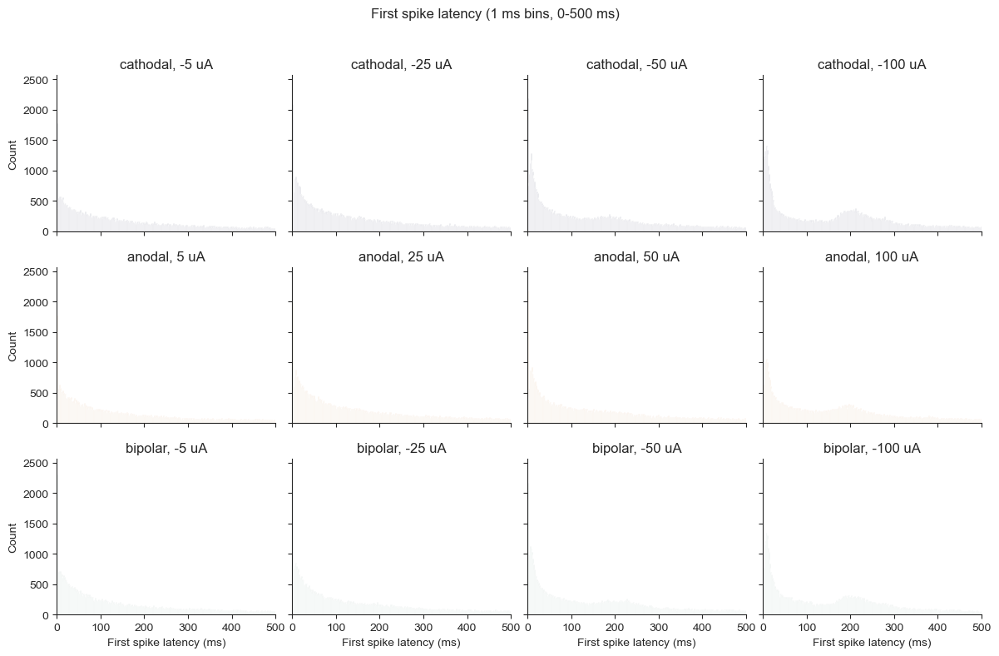

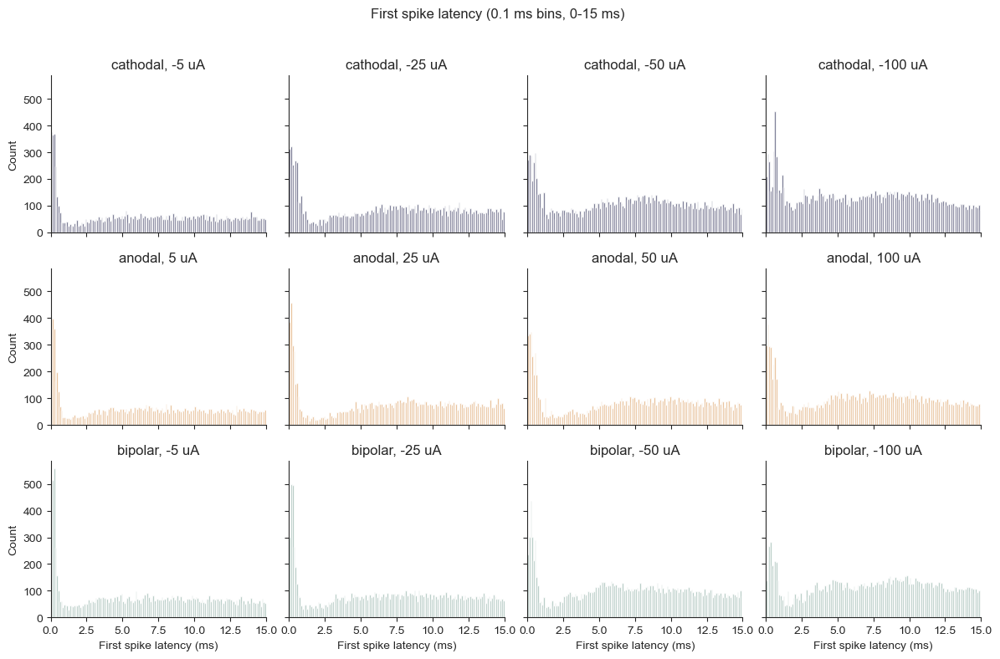

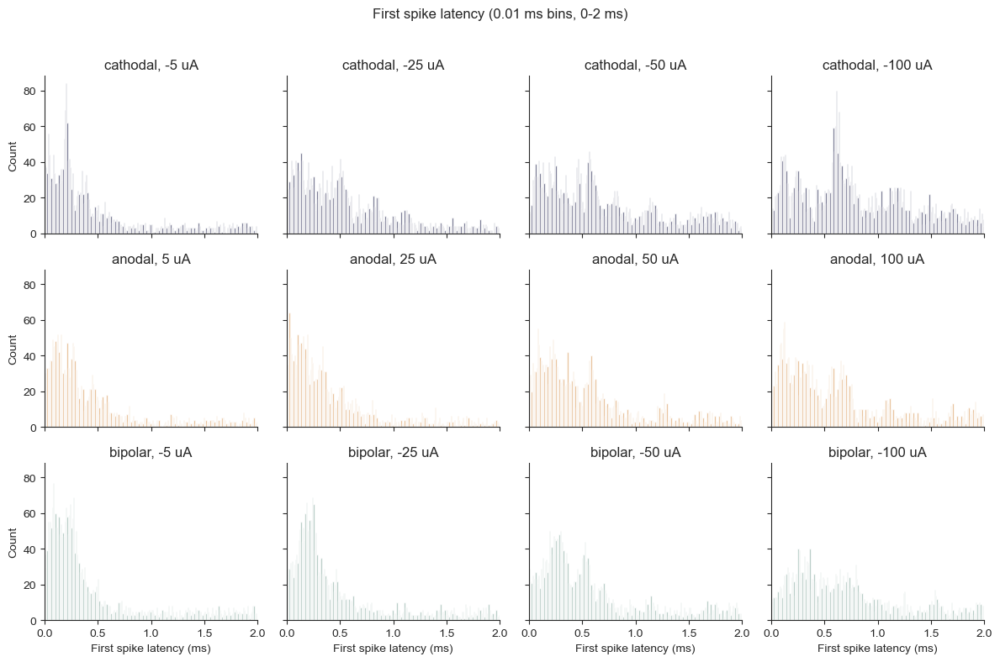

In [7]:
def plot_lat_hist_grid(latencies_by_pol_amp, polarity_settings, bins, xlim, xlabel, title):
    fig, axs = plt.subplots(3, 4, figsize=(12, 8), sharex=True, sharey=True)
    for pol_idx, (pol, amps, _, row, color) in enumerate(polarity_settings):
        for col, amp in enumerate(amps):
            ax = axs[row, col]
            lats = np.array(latencies_by_pol_amp[pol][amp])
            ax.hist(lats, bins=bins, color=color, alpha=0.8)
            ax.set_xlim(*xlim)
            ax.set_title(f'{pol}, {amp} uA')
            ax.spines[['top', 'right']].set_visible(False)
            if col == 0:
                ax.set_ylabel('Count')
            if row == 2:
                ax.set_xlabel(xlabel)
    plt.suptitle(title)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    
# Full 500 ms, 1 ms bins
hist_bins_1ms = np.arange(0, 501, 1)
# First 15 ms, 0.1 ms bins
hist_bins_01ms = np.arange(0, 15.1, 0.1)
# First 2 ms, 0.01 ms bins (already used before)
hist_bins_10us = np.arange(0, 2.01, 0.01)

# 1. Full 500 ms
plot_lat_hist_grid(
    latencies_by_pol_amp, 
    polarity_settings, 
    bins=hist_bins_1ms, 
    xlim=(0, 500), 
    xlabel='First spike latency (ms)', 
    title='First spike latency (1 ms bins, 0-500 ms)'
)

# 2. First 15 ms
plot_lat_hist_grid(
    latencies_by_pol_amp, 
    polarity_settings, 
    bins=hist_bins_01ms, 
    xlim=(0, 15), 
    xlabel='First spike latency (ms)', 
    title='First spike latency (0.1 ms bins, 0-15 ms)'
)

# 3. First 2 ms 
plot_lat_hist_grid(
    latencies_by_pol_amp, 
    polarity_settings, 
    bins=hist_bins_10us, 
    xlim=(0, 2), 
    xlabel='First spike latency (ms)', 
    title='First spike latency (0.01 ms bins, 0-2 ms)'
)


# calculating direct response probabilities (within 2 ms)

this block of code calculates the direct response probabilities from which further statistics and figures are generated

## calculate the direct response probabilities

In [4]:
def bin_spikes(units_df, bin_size=60):
    """ Bin spike times into intervals and calculate firing rates for all units over a common time window. """
    # determine the global minimum and maximum spike times across all units 
    all_spike_times = np.concatenate(units_df['spike_times'].values)
    global_min_time = all_spike_times.min()
    global_max_time = all_spike_times.max()

    # create bins based on the global time window
    bins = np.arange(global_min_time, global_max_time + bin_size, bin_size)

    binned_rates = []
    for spike_times in units_df['spike_times']:
        counts, _ = np.histogram(spike_times, bins)
        rates = counts / bin_size  # Firing rate = Counts per second
        binned_rates.append(rates)

    return binned_rates

for r in recordings:
    binned_rates = bin_spikes(r.units, bin_size=60)
    r.units['binned_rates'] = binned_rates
    r.units['mean_rate'] = r.units['binned_rates'].apply(np.mean)
    
    
def spike_probability(spike_times, stim_times, window = 0.002, min_spike_count = 0):
    # find how many spikes occur betwween the first stimulus and the last stimulus) 
    first_stim_time = stim_times[0]
    last_stim_time = stim_times[-1]
    spike_count = np.sum((spike_times >= first_stim_time) & (spike_times <= last_stim_time))
    
    if spike_count > min_spike_count:
        # Count spikes within 3 ms of any stim time
        spike_counts_within_window = sum(
            np.any((spike_times <= stim + window) & (spike_times >= stim)) for stim in stim_times
        )
        spike_counts_baseline = sum(
            np.any((spike_times <= stim - (0.003+window)) & (spike_times > stim - (0.005 + window))) for stim in stim_times
        )
        # Probability is the count of spikes within the window divided by the total number of stimulations
        probability = spike_counts_within_window / len(stim_times)
        probability_baseline = spike_counts_baseline / len(stim_times)
        norm_prob = probability - probability_baseline
        
    else:
        probability = np.nan
        probability_baseline = np.nan
        norm_prob = np.nan
    return probability, probability_baseline, norm_prob

In [5]:
distances = {}
distances_norm = {}

for r in recordings:
    contact = r.trials.contact_negative[0]
    distances[r.mouse] = r.get_dists(contact)
    
    temp_norm_dist = {}
    for probe, dists in r.distances.items():
        # normalize min dist to 0 
        min = np.min(dists)
        dists_norm = dists - min
        
        
        # make prior to crossing point negative and after positive
        cross_index = np.where(dists_norm == 0)[0][0]  # this gives the first index where data is non-positive
        dists_norm[cross_index:] = -np.abs(dists_norm[cross_index:])
        temp_norm_dist[probe] = dists_norm

        dists[cross_index:] = -np.abs(dists[cross_index:])
        r.distances[probe] = dists
    
    distances_norm[r.mouse] = temp_norm_dist

In [6]:
probability_dict = {} # keys are col_str (amp_polarity), unit dicts 
counter_string = []
amps = [-5, 5, -25, 25, -50, 50, -100, 100]
polarities = ['bipolar', 'monopolar']


for polarity in polarities:
    for amp in amps:
        col_str = f'{str(amp)}_{polarity}'
        results = []
        
        
        units_counter = 0 
        included_units_counter = 0 

        for r in recordings:
            stim_times = choose_stim_parameter(r.trials, amp = amp, pulse_number = 1, pulse_duration = 100, polarity = polarity)
            if len(stim_times) > 75:
                stim_times = stim_times[0:75]
            probe_list = [k for k in distances_norm[r.mouse].keys()]
            brain_regs = r.brain_regs
            
            good_units = r.units[(r.units.group == 'good') & (r.units.slope_outlier == False)]

            df_list = []
            if 'probeA' in probe_list:
                A_units = good_units.loc[r.units['probe'] == 'A']
                df_list.append(A_units)
            if 'probeB' in probe_list:
                B_units = good_units.loc[r.units['probe'] == 'B']
                df_list.append(B_units)
            if 'probeC' in probe_list:
                C_units = good_units.loc[r.units['probe'] == 'C']
                df_list.append(C_units)
            if len(stim_times) > 75:
                stim_times = stim_times[0:75] 
            if len(stim_times) > 0:
                for probe, df in zip(probe_list, df_list):
                    for id, unit in df.iterrows():
                        spike_times = np.array(unit.spike_times)  
                        ch = unit.ch
                        if ch > len(brain_regs[probe]) -1:
                            ch = len(brain_regs[probe]) - 1
                            print(f'ch: {ch} is out of range for recording {r.mouse} probe {probe}')
                        norm_distance = distances_norm[r.mouse][probe][ch] # reverse_distance[ch]  # Get the distance of the unit from the stim
                        distance = distances[r.mouse][probe][ch] 
                        reg = brain_regs[probe][ch]

                        # Count spikes within 2 ms of any stim time
                        probability, probability_baseline, norm_prob = spike_probability(spike_times, stim_times, window = 0.002)
                        units_counter +=1 
                        if not np.isnan(probability):
                            results.append({'recording': r.mouse, 'unit_id': unit.unit_id,'probe': unit.probe, 'ch': ch,
                                            'distance': distance, 'norm_distance': norm_distance,  'waveform_class': unit.waveform_class,'unit_amplitude': unit.KSamplitude, 
                                            'norm_prob': norm_prob, 'probability': probability, 'region': reg, 'fr': unit.mean_rate})
                            included_units_counter +=1
            
            probability_dict[col_str] = results
        counter_string.append(f'{col_str}: total units: {units_counter} included units = {included_units_counter}.')


These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique cathodal [15 11]
Returning the first one: 15
ch: 239 is out of range for recording jlh39 probe probeA
ch: 239 is out of range for recording jlh39 probe probeA
ch: 279 is out of range for recording jlh48 probe probeC
ch: 279 is out of range for recording jlh48 probe probeC
ch: 279 is out of range for recording jlh48 probe probeC
ch: 259 is out of range for recording jlh49v1 probe probeB
These are the multiple unique cathodal [16  7  4]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
ch: 279 is out of range for recording jlh48 probe probeC
ch: 279 is out of range for recording jlh48 probe probeC
ch: 279 is out of range for recording jlh48 probe probeC
These are the multiple unique cathodal [16  4]
Returning the first one: 16
These are the multiple unique cathodal [16 10]
Returning the first one: 16
These are the multiple unique ca

## wrangle into DF (with cleaned up "region" labels)

In [7]:
def map_region_to_group(region):
    if 'Primary visual area' in region:
        return 'Primary Visual Area'
    elif 'Anterior area' in region:
        return 'Higher Visual Area'
    elif 'Lateral visual area' in region:
        return 'Higher Visual Area'
    elif 'Rostrolateral visual area' in region:
        return 'Higher Visual Area'
    elif 'posteromedial area' in region:
        return 'Higher Visual Area'
    elif 'Anteromedial visual area' in region:
        return 'Higher Visual Area'
    elif 'Retrosplenial' in region:
        return 'Retrosplenial'
    elif 'optic radiation' in region:
        return 'Optic Radiation'
    elif 'corpus' in region:
        return 'Corpus Callosum'
    elif 'Unknown' in region:
        return 'Unknown'
    elif 'area' not in region:
        return 'subcortical' 

cat_df5 = pd.DataFrame(probability_dict['-5_monopolar'])
cat_df25 = pd.DataFrame(probability_dict['-25_monopolar'])
cat_df50 = pd.DataFrame(probability_dict['-50_monopolar'])
cat_df100 = pd.DataFrame(probability_dict['-100_monopolar'])

an_df5 = pd.DataFrame(probability_dict['5_monopolar'])
an_df25 = pd.DataFrame(probability_dict['25_monopolar'])
an_df50 = pd.DataFrame(probability_dict['50_monopolar'])
an_df100 = pd.DataFrame(probability_dict['100_monopolar'])

bi_df5 = pd.DataFrame(probability_dict['-5_bipolar'])
bi_df25 = pd.DataFrame(probability_dict['-25_bipolar'])
bi_df50 = pd.DataFrame(probability_dict['-50_bipolar'])
bi_df100 = pd.DataFrame(probability_dict['-100_bipolar'])


cat_df5['region_group'] = cat_df5['region'].apply(map_region_to_group)
cat_df25['region_group'] = cat_df25['region'].apply(map_region_to_group)
cat_df50['region_group'] = cat_df50['region'].apply(map_region_to_group)
cat_df100['region_group'] = cat_df100['region'].apply(map_region_to_group)

an_df5['region_group'] = an_df5['region'].apply(map_region_to_group)
an_df25['region_group'] = an_df25['region'].apply(map_region_to_group)
an_df50['region_group'] = an_df50['region'].apply(map_region_to_group)
an_df100['region_group'] = an_df100['region'].apply(map_region_to_group)

bi_df5['region_group'] = bi_df5['region'].apply(map_region_to_group)
bi_df25['region_group'] = bi_df25['region'].apply(map_region_to_group)
bi_df50['region_group'] = bi_df50['region'].apply(map_region_to_group)
bi_df100['region_group'] = bi_df100['region'].apply(map_region_to_group)

C:\Users\jordan\AppData\Local\Temp\ipykernel_134792\1398074626.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  proportion_high_responders = cat_df50.groupby(['recording', 'region_group']).apply(


(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'jlh31'),
  Text(1, 0, 'jlh32'),
  Text(2, 0, 'jlh33'),
  Text(3, 0, 'jlh34'),
  Text(4, 0, 'jlh40'),
  Text(5, 0, 'jlh48'),
  Text(6, 0, 'jlh53concat')])

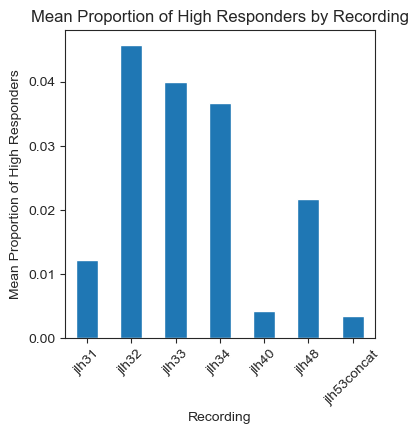

In [8]:
# Calculate proportion of high responders by 'recording' and 'region_group'
proportion_high_responders = cat_df50.groupby(['recording', 'region_group']).apply(
    lambda x: (x['norm_prob'] > 0.10).mean()
).reset_index(name='proportion_high_responders')

# Calculate mean proportion for each 'recording'
mean_proportion_by_recording = proportion_high_responders.groupby('recording')['proportion_high_responders'].mean()

# Plotting
mean_proportion_by_recording.plot(kind='bar', figsize=(4, 4))
plt.xlabel('Recording')
plt.ylabel('Mean Proportion of High Responders')
plt.title('Mean Proportion of High Responders by Recording')
plt.xticks(rotation=45) 

## combining dfs for simplicity and other plotting

In [9]:
bi_direct = [bi_df5, bi_df25, bi_df50, bi_df100]
for df, amp in zip(bi_direct, [-5, -25, -50, -100]):
    df['polarity'] = 'bipolar'
    df['amplitude'] = amp

bi_direct_df = pd.concat(bi_direct)

cat_direct = [cat_df5, cat_df25, cat_df50, cat_df100]
for df, amp in zip(cat_direct, [-5, -25, -50, -100]):
    df['polarity'] = 'cathodal'
    df['amplitude'] = amp

cat_direct_df = pd.concat(cat_direct)

an_direct = [an_df5, an_df25, an_df50, an_df100]
for df, amp in zip(an_direct, [5, 25, 50, 100]):
    df['polarity'] = 'anodal'
    df['amplitude'] = amp

an_direct_df = pd.concat(an_direct)

direct_df = pd.concat([bi_direct_df, cat_direct_df, an_direct_df])

## load in EP boundaries (from figure 2) confines for overlays

In [10]:
dfs_list = {
    'cathodal': [cat_df5, cat_df25, cat_df50, cat_df100],
    'anodal': [an_df5, an_df25, an_df50, an_df100],
    'bipolar': [bi_df5, bi_df25, bi_df50, bi_df100]
}

# load the confines:: organized by polarity --> amplitude --> (lower_bound, upper_bound)
#pickle_path = r"C:\Users\jordan\Documents\combined_figs\evoked_potentials\EP_distances.pkl"

import pickle as pkl
with open(r'intermediates\EP_distances.pkl', 'rb') as file:
    EP_distances = pkl.load(file)

confines = {
            'bipolar': 
                        {   '5': (np.mean(EP_distances['bipolar'][-5][0]), np.mean(EP_distances['bipolar'][-5][1])), 
                            '25': (np.mean(EP_distances['bipolar'][-25][0]), np.mean(EP_distances['bipolar'][-25][1])),
                            '50': (np.mean(EP_distances['bipolar'][-50][0]), np.mean(EP_distances['bipolar'][-50][1])),
                            '100': (np.mean(EP_distances['bipolar'][-100][0]), np.mean(EP_distances['bipolar'][-100][1]))
                        },
            'cathodal':
                        {   '5': (np.mean(EP_distances['monopolar'][-5][0]), np.mean(EP_distances['monopolar'][-5][1])),
                            '25': (np.mean(EP_distances['monopolar'][-25][0]), np.mean(EP_distances['monopolar'][-25][1])),
                            '50': (np.mean(EP_distances['monopolar'][-50][0]), np.mean(EP_distances['monopolar'][-50][1])),
                            '100': (np.mean(EP_distances['monopolar'][-100][0]), np.mean(EP_distances['monopolar'][-100][1]))
                        },
            'anodal':
                        {   '5': (np.mean(EP_distances['monopolar'][5][0]), np.mean(EP_distances['monopolar'][5][1])),
                            '25': (np.mean(EP_distances['monopolar'][25][0]), np.mean(EP_distances['monopolar'][25][1])),
                            '50': (np.mean(EP_distances['monopolar'][50][0]), np.mean(EP_distances['monopolar'][50][1])),
                            '100': (np.mean(EP_distances['monopolar'][100][0]), np.mean(EP_distances['monopolar'][100][1]))
                        }
            }
confines_dfs = {'cathodal': [], 'anodal': [], 'bipolar': []}

# Loop through the dfs_list and confines to create the subsets
for condition, dfs in dfs_list.items():
    for i, df in enumerate(dfs):
        key = str([5, 25, 50, 100][i])  # Get the key for confines
        lower_bound, upper_bound = confines[condition][key]
        confine_df = df[(df['distance'] >= lower_bound) & (df['distance'] <= upper_bound)]
        confines_dfs[condition].append(confine_df)

# Figure 4g, supplemental --  distance from stim by normalized probabilities with EP overlays 

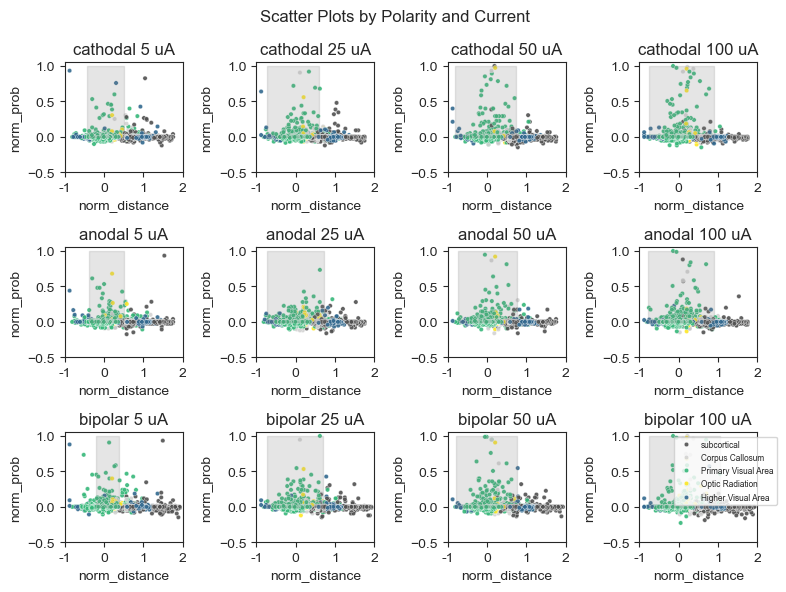

In [11]:
# distance
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

x = 'norm_distance'
y = 'norm_prob'
hue = 'region_group'
prob_threshold = -0.5

size = 10
alpha = 0.9

# define the order of your labels and create a Viridis colormap
labels = ['Retrosplenial', 'Higher Visual Area', 'Primary Visual Area', 'Optic Radiation', 'Corpus Callosum', 'subcortical']
viridis = plt.get_cmap('viridis', len(labels) - 2)  # Exclude two for custom colors
colors = [mcolors.rgb2hex(viridis(i)) for i in range(viridis.N)]
custom_palette = dict(zip(labels[:-2], colors))
# custom colors for 'Corpus Callosum' and 'subcortical'
custom_palette['Corpus Callosum'] = '#D3D3D3'  # Light gray
custom_palette['subcortical'] = '#505050'  # Dark gray

# Create a 3x4 grid for subplots (rows for polarities, columns for current amplitudes)
fig, axs = plt.subplots(3, 4, figsize=(8, 6))
#fig.subplots_adjust(hspace=0.2, wspace=0.2)  

polarities = ['cathodal', 'anodal', 'bipolar']
dfs_list = {
    'cathodal': [cat_df5, cat_df25, cat_df50, cat_df100],
    'anodal': [an_df5, an_df25, an_df50, an_df100],
    'bipolar': [bi_df5, bi_df25, bi_df50, bi_df100]
}

for row, polarity in enumerate(polarities):
    dfs = dfs_list[polarity]

    # apply probability threshold filtering and filter out 'Unknown' and None for each DataFrame
    dfs = [df[(df[y] > prob_threshold) & (df['region_group'].isin(labels))] for df in dfs]

    for col, df in enumerate(dfs):
        sns.scatterplot(data=df, x=x, y=y, hue=hue, ax=axs[row, col], alpha=alpha, s=size, palette=custom_palette) #, legend=None)
        if axs[row, col] != axs[2, 3]:
            axs[row, col].get_legend().remove()
        else:
            axs[row, col].legend(loc='upper right', bbox_to_anchor=(1.2, 1), fontsize = 6)
            
        axs[row, col].set_title(f'{polarity} { [5, 25, 50, 100][col] } uA')
        axs[row, col].set_ylim(-0.5, 1.05)
        axs[row, col].set_xlim(-1000, 2000)
        axs[row, col].set_xticks([-1000, 0, 1000, 2000])
        axs[row, col].set_xticklabels([-1, 0, 1, 2])
        axs[row, col].set_yticks([-0.5, 0, 0.5, 1])

        # add shaded box region for the electric field confines
        current = [5, 25, 50, 100][col]
        lower_bound, upper_bound = confines[polarity][str(current)]
        axs[row, col].fill_betweenx([0, 1], lower_bound, upper_bound, color='gray', alpha=0.2)

        # Set common labels and title
        axs[row, col].set(xlabel=x, ylabel=y)

# adjust the legend on the last plot
#handles, labels = axs[row, 3].get_legend_handles_labels()
#fig.legend(handles, labels, loc='upper right')

plt.suptitle('Scatter Plots by Polarity and Current', size=12)
plt.tight_layout()

save_path = r'C:\Users\jordan\Documents\combined_figs\single_unit\direct_response\2ms\single_unit_scatters'
if not os.path.exists(save_path):
    os.makedirs(save_path)
#plt.savefig(os.path.join(save_path, 'distance_scatter_fieldsoverlay_legend_norm_largerylim.pdf'))
#plt.savefig(os.path.join(save_path, 'distance_scatter_fieldsoverlay_legend_norm_largerylim.png'))



In [12]:
# calculate the proportion of single units within the evoked potential bounds for each polarity and amplitude 
from collections import defaultdict

# rest of the variables above
amplitudes = [5, 25, 50, 100]
# store proportions in a nested dict
proportions = defaultdict(dict)

for polarity in polarities:
    dfs = dfs_list[polarity]

    for i, current in enumerate(amplitudes):
        df = dfs[i]
    
        df_filtered = df[(df[y] > prob_threshold) & (df['region_group'].isin(labels))]
        
        lower_bound, upper_bound = confines[polarity][str(current)]
        
        total = len(df_filtered)
        if total == 0:
            proportions[polarity][current] = np.nan
            continue

        within = df_filtered[(df_filtered[x] >= lower_bound) & (df_filtered[x] <= upper_bound)]
        prop_within = len(within) / total

        proportions[polarity][current] = prop_within

# Convert to DataFrame for easy viewing
proportions_df = pd.DataFrame(proportions).T  # polarities as rows, amplitudes as columns
print("Proportion of points within evoked potential bounds:")
print(proportions_df.round(3))



Proportion of points within evoked potential bounds:
            5      25     50     100
cathodal  0.566  0.642  0.757  0.852
anodal    0.554  0.747  0.769  0.855
bipolar   0.414  0.693  0.754  0.882


# Figure 4h, i -- direct responder density heatmaps

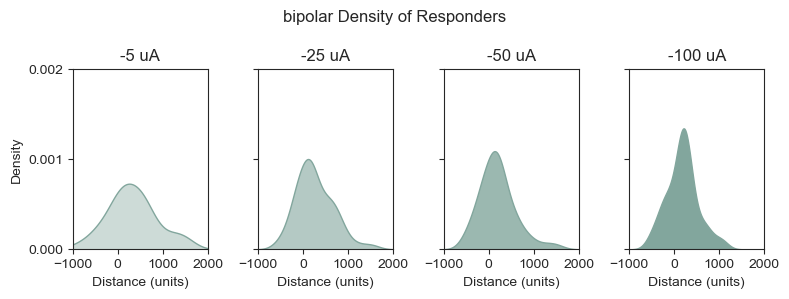

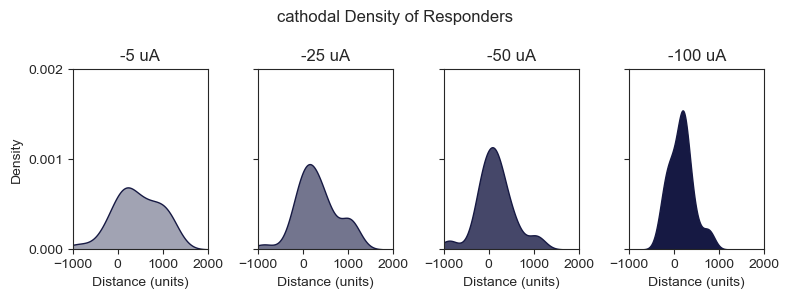

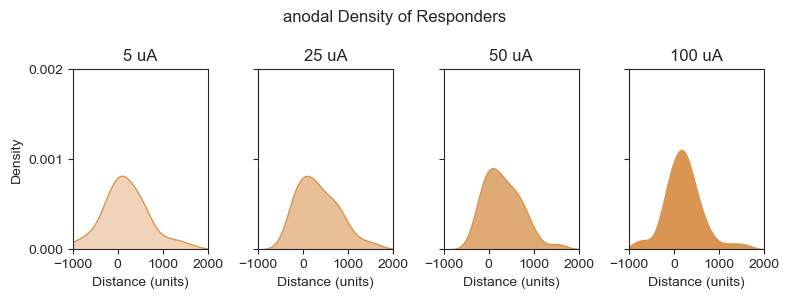

In [13]:
 # bipolar: '#82A69D' cathodal: '#161943' anodal: '#D99551' 
colors = ['#82A69D','#161943', '#D99551']
pols = ['bipolar', 'cathodal', 'anodal']
for x, df in enumerate([bi_direct_df, cat_direct_df, an_direct_df]):
    color = colors[x]
    fig, ax = plt.subplots(1,4, figsize = (8, 3), sharey = True)
    axs = ax.ravel()
    alphas = [0.4,0.6,0.8,1]
    for i, amp in enumerate(df.amplitude.unique()):
        alpha = alphas[i]
        amp_df = df[df['amplitude'] == amp]
        amp_df_res = amp_df[amp_df['norm_prob'] > 0.15]
        # violin plot for distance
        sns.kdeplot(data=amp_df_res, x='norm_distance', fill=True, ax = axs[i], color = color,  alpha = alpha)
        
        axs[i].set_xlabel('Distance (units)', fontsize=10)
        axs[i].set_ylabel('Density', fontsize=10)
        axs[i].set_ylim(0,0.0020)
        axs[i].set_title(f'{amp} uA', fontsize=12)
        axs[i].set_xlim(-1000, 2000)
        axs[i].set_xticks([-1000, 0, 1000, 2000])
        axs[i].set_yticks([0, 0.001, 0.002])
    plt.suptitle(f'{pols[x]} Density of Responders', fontsize=12)
    plt.tight_layout()
    #plt.savefig(f'C:\\Users\\jordan\\Documents\\combined_figs\\single_unit\\direct_response\\2ms\\{pols[x]}_density_responders.png')
    #plt.savefig(f'C:\\Users\\jordan\\Documents\\combined_figs\\single_unit\\direct_response\\2ms\\{pols[x]}_density_responders.pdf')

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should

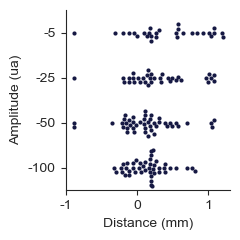

In [14]:
from scipy.stats import sem
df = cat_direct_df
fig, ax = plt.subplots(figsize = (2.5,2.5))

dists_dict = {}
for amp in df.amplitude.unique():
    
    amp_df = df[df['amplitude'] == amp]
    amp_df_res = amp_df[amp_df['norm_prob'] > 0.15]
    dists = amp_df_res.norm_distance.values
    
    dists_dict[amp] = dists
    sns.swarmplot(data=amp_df_res, x='norm_distance', y='amplitude', ax=ax, orient='h', color=cathodal_color, alpha=1, size = 3)
    ax.set_xticks([-1000, 0, 1000], ['-1', '0', '1'])
    ax.set_xlabel('Distance (mm)')
    ax.set_ylabel('Amplitude (ua)')
    median_dist = np.median(dists)
    sem_dist = sem(dists)
    
    ax.set_title(f'')
    ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()

In [15]:
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

dist5 = dists_dict[-5]
dist25 = dists_dict[-25]
dist50 = dists_dict[-50]
dist100 = dists_dict[-100]
data_list = [dist5, dist25, dist50, dist100]

# 1) Prepare data in long-form for statsmodels
labels = ['5 ua'] * len(dist5) + ['25 ua'] * len(dist25) + ['50 ua'] * len(dist50) + ['100 ua'] * len(dist100)
values = np.concatenate([dist5, dist25, dist50, dist100])
df = pd.DataFrame({'amplitude': labels, 'value': values})

# 2) One-way ANOVA
model = ols('value ~ C(amplitude)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)

# 3) Post-hoc: Tukey's HSD
tukey = pairwise_tukeyhsd(df['value'], df['amplitude'], alpha=0.05)
print(tukey)

                    sum_sq     df         F    PR(>F)
C(amplitude)  1.987281e+06    3.0  4.151713  0.007378
Residual      2.377371e+07  149.0       NaN       NaN
  Multiple Comparison of Means - Tukey HSD, FWER=0.05   
group1 group2  meandiff p-adj    lower    upper   reject
--------------------------------------------------------
100 ua  25 ua  154.2678 0.3275  -81.5659 390.1015  False
100 ua   5 ua  280.0835 0.0194   32.9403 527.2267   True
100 ua  50 ua   -8.7323 0.9996 -227.5321 210.0674  False
 25 ua   5 ua  125.8157 0.5986 -136.5275  388.159  False
 25 ua  50 ua -163.0001 0.2794 -398.8339  72.8336  False
  5 ua  50 ua -288.8159 0.0148 -535.9591 -41.6727   True
--------------------------------------------------------


Kruskal–Wallis H=10.101, p=1.773e-02
          1         2         3         4
1  1.000000  0.458306  0.033204  0.044787
2  0.458306  1.000000  0.334920  0.355569
3  0.033204  0.334920  1.000000  0.854648
4  0.044787  0.355569  0.854648  1.000000


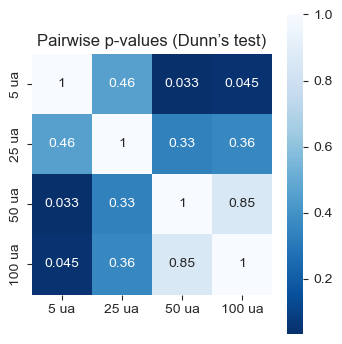

In [16]:
## non parametric ANOVA (kinda gets at distribution but also differences... maybe want to do KS tests )
import scipy.stats as stats
import scikit_posthocs as sp

dist5 = dists_dict[-5]
dist25 = dists_dict[-25]
dist50 = dists_dict[-50]
dist100 = dists_dict[-100]
data_list = [dist5, dist25, dist50, dist100]

# 1) Kruskal–Wallis for overall difference
H, p = stats.kruskal(*data_list)
print(f"Kruskal–Wallis H={H:.3f}, p={p:.3e}")

# 2) only interpret if p < alpha -- post-hoc Dunn’s test
posthoc = sp.posthoc_dunn(data_list, p_adjust='holm-sidak')
print(posthoc)

# 3) visualize pairwise p-values in a heatmap
fig = plt.figure(figsize=(3.54, 3.54))
sns.heatmap(posthoc, annot=True, cmap='Blues_r', vmax=1, square=True,
            xticklabels=['5 ua','25 ua','50 ua','100 ua'],
            yticklabels=['5 ua','25 ua','50 ua','100 ua'])
plt.title('Pairwise p-values (Dunn’s test)')
plt.tight_layout()

In [17]:
# pairwise KS tests for initial exploration
dist5 = dists_dict[-5]
dist25 = dists_dict[-25]
dist50 = dists_dict[-50]
dist100 = dists_dict[-100]

_, p5_25 = stats.ks_2samp(dist5, dist25)  # compare 5 and 25
print(f"KS test between 5 and 25 uA: p={p5_25:.3}")
_, p5_50 = stats.ks_2samp(dist5, dist50)
print(f"KS test between 5 and 50 uA: p={p5_50:.3}")
_, p5_100 = stats.ks_2samp(dist5, dist100)
print(f"KS test between 5 and 100 uA: p={p5_100:.3}")
_, p25_50 = stats.ks_2samp(dist25, dist50)
print(f"KS test between 25 and 50 uA: p={p25_50:.3}")
_, p25_100 = stats.ks_2samp(dist25, dist100)
print(f"KS test between 25 and 100 uA: p={p25_100:.3}")
_, p50_100 = stats.ks_2samp(dist50, dist100)
print(f"KS test between 50 and 100 uA: p={p50_100:.3}")


KS test between 5 and 25 uA: p=0.243
KS test between 5 and 50 uA: p=0.0105
KS test between 5 and 100 uA: p=0.00275
KS test between 25 and 50 uA: p=0.258
KS test between 25 and 100 uA: p=0.106
KS test between 50 and 100 uA: p=0.825


In [18]:
from statsmodels.stats.multitest import multipletests
p_vals = [
    p5_25, p5_50, p5_100,
    p25_50, p25_100,
    p50_100
]
p_labels = [
    '5 vs 25 uA', '5 vs 50 uA', '5 vs 100 uA',
    '25 vs 50 uA', '25 vs 100 uA', '50 vs 100 uA']

# Holm–Šidák correction
reject, p_corrected, _, _ = multipletests(p_vals, method='holm-sidak')

for lab, p in zip(p_labels, p_corrected):
    print(f'{lab}: p_corrected={p:.3f}, reject={reject[p_labels.index(lab)]}')

5 vs 25 uA: p_corrected=0.566, reject=False
5 vs 50 uA: p_corrected=0.052, reject=False
5 vs 100 uA: p_corrected=0.016, reject=True
25 vs 50 uA: p_corrected=0.566, reject=False
25 vs 100 uA: p_corrected=0.363, reject=False
50 vs 100 uA: p_corrected=0.825, reject=False


# Figure 4e -- proportion of direct responders

### all regions

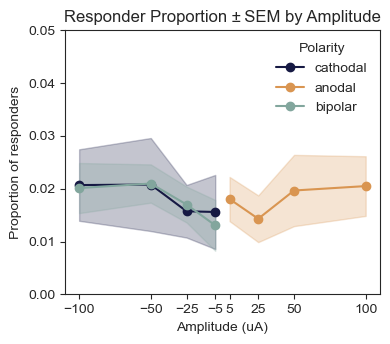

In [19]:
# ── parameters ─────────────────────────────────────────────────────────
responder_thresh = 0.15
polarities       = ['cathodal', 'anodal', 'bipolar']   # keep a fixed order for plotting
palette          = dict(zip(polarities, sns.color_palette('Set1', n_colors=len(polarities))))
# ──────────────────────────────────────────────────────────────────────

# 1) tag responders
df_tagged = direct_df.assign(responder = direct_df['norm_prob'] > responder_thresh)

# 2) proportion of responders **per recording** 
per_rec = (
    df_tagged
    .groupby(['polarity', 'amplitude', 'recording'], as_index=False)
    .agg(prop = ('responder', 'mean'))
)

# 3) collapse recordings → mean & SEM
summary = (
    per_rec
    .groupby(['polarity', 'amplitude'], as_index=False)
    .agg(mean = ('prop', 'mean'),
         sem  = ('prop', lambda x: x.std(ddof=1) / np.sqrt(len(x))))
)

polarity_colors = {
    'bipolar': '#82A69D',
    'cathodal': '#161943',
    'anodal': '#D99551'
}

# Plot
fig, ax = plt.subplots(figsize=(4, 3.54))

for pol in polarities:
    d = summary[summary['polarity'] == pol].sort_values('amplitude')
    
    ax.plot(d['amplitude'], d['mean'],
            marker='o', label=pol, color=polarity_colors[pol])
    
    ax.fill_between(d['amplitude'],
                    d['mean'] - d['sem'],
                    d['mean'] + d['sem'],
                    alpha=0.25, color=polarity_colors[pol])

ax.set_ylabel('Proportion of responders')
ax.set_xlabel('Amplitude (uA)')
ax.set_xticks([-100, -50, -25, -5, 5, 25, 50, 100])
ax.set_ylim(0, 0.05)
ax.set_title('Responder Proportion ± SEM by Amplitude')
ax.legend(title='Polarity', frameon=False)
plt.tight_layout()

### v1 neurons only

In [20]:
df_tagged.region_group.unique()

array(['subcortical', 'Corpus Callosum', 'Primary Visual Area',
       'Optic Radiation', 'Higher Visual Area', None, 'Unknown'],
      dtype=object)

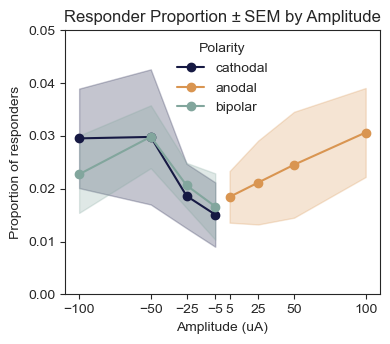

In [21]:
# ── parameters ─────────────────────────────────────────────────────────
responder_thresh = 0.15
polarities       = ['cathodal', 'anodal', 'bipolar']   # keep a fixed order for plotting
palette          = dict(zip(polarities, sns.color_palette('Set1', n_colors=len(polarities))))
# ──────────────────────────────────────────────────────────────────────

# 1) tag responders
df_tagged = direct_df.assign(responder = direct_df['norm_prob'] > responder_thresh)

df_tagged_v1 = df_tagged[df_tagged['region_group'] == 'Primary Visual Area']

# 2) proportion of responders **per recording** 
per_rec = (
    df_tagged_v1
    .groupby(['polarity', 'amplitude', 'recording'], as_index=False)
    .agg(prop = ('responder', 'mean'))
)

# 3) collapse recordings → mean & SEM
summary = (
    per_rec
    .groupby(['polarity', 'amplitude'], as_index=False)
    .agg(mean = ('prop', 'mean'),
         sem  = ('prop', lambda x: x.std(ddof=1) / np.sqrt(len(x))))
)

polarity_colors = {
    'bipolar': '#82A69D',
    'cathodal': '#161943',
    'anodal': '#D99551'
}

# Plot
fig, ax = plt.subplots(figsize=(4, 3.54))

for pol in polarities:
    d = summary[summary['polarity'] == pol].sort_values('amplitude')
    
    ax.plot(d['amplitude'], d['mean'],
            marker='o', label=pol, color=polarity_colors[pol])
    
    ax.fill_between(d['amplitude'],
                    d['mean'] - d['sem'],
                    d['mean'] + d['sem'],
                    alpha=0.25, color=polarity_colors[pol])

ax.set_ylabel('Proportion of responders')
ax.set_xlabel('Amplitude (uA)')
ax.set_xticks([-100, -50, -25, -5, 5, 25, 50, 100])
ax.set_ylim(0, 0.05)
ax.set_title('Responder Proportion ± SEM by Amplitude')
ax.legend(title='Polarity', frameon=False)
plt.tight_layout()

In [22]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Ensure amplitude is float (continuous)
per_rec['amplitude'] = per_rec['amplitude'].astype(float)

# Run two-way ANOVA with interaction
model = ols('prop ~ C(polarity) * amplitude', data=per_rec).fit()
anova_table = sm.stats.anova_lm(model, typ=2)  # type 2 is fine for this structure
print(anova_table)


                         sum_sq    df         F    PR(>F)
C(polarity)            0.000122   2.0  0.152460  0.858839
amplitude              0.000119   1.0  0.296075  0.587848
C(polarity):amplitude  0.001507   2.0  1.877911  0.159506
Residual               0.032492  81.0       NaN       NaN


In [23]:
from statsmodels.formula.api import ols
import statsmodels.api as sm

# Subset to cathodal
cathodal_data = per_rec[per_rec['polarity'] == 'cathodal'].copy()
cathodal_data['amplitude'] = cathodal_data['amplitude'].astype(float)  # ensure it's numeric

# Fit linear model: proportion ~ amplitude
model = ols('prop ~ amplitude', data=cathodal_data).fit()

# Run ANOVA
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)


             sum_sq    df         F    PR(>F)
amplitude  0.000881   1.0  1.629969  0.212993
Residual   0.014057  26.0       NaN       NaN


In [24]:
direct_df['responder'] = direct_df['norm_prob'] > responder_thresh

In [25]:
direct_df[direct_df['responder'] == True].head()

,recording,unit_id,probe,ch,distance,norm_distance,waveform_class,unit_amplitude,norm_prob,probability,region,fr,region_group,polarity,amplitude,responder
20,jlh31,A181,A,100,361.559124,202.427103,rs,1150.0,0.226667,0.226667,"Primary visual area, layer 6a",1.131381,Primary Visual Area,bipolar,-5,True
118,jlh31,A759,A,119,247.250885,88.118864,fs,1193.6,0.173333,0.173333,"Primary visual area, layer 5",1.472673,Primary Visual Area,bipolar,-5,True
247,jlh31,B869,B,88,274.699836,121.138773,fs,968.2,0.213333,0.226667,"Primary visual area, layer 6a",4.127778,Primary Visual Area,bipolar,-5,True
257,jlh31,C5,C,14,1549.017721,1360.621862,rs,1022.3,0.186667,0.186667,"Lateral visual area, layer 6a",4.674775,Higher Visual Area,bipolar,-5,True
284,jlh31,C61,C,72,1000.953545,812.557686,rs,994.3,0.240000,0.266667,"Primary visual area, layer 6a",1.499399,Primary Visual Area,bipolar,-5,True


# Figure 4e probability of "responders" 

responders, here, are units that are responsive to any amplitude within a stimulation condition

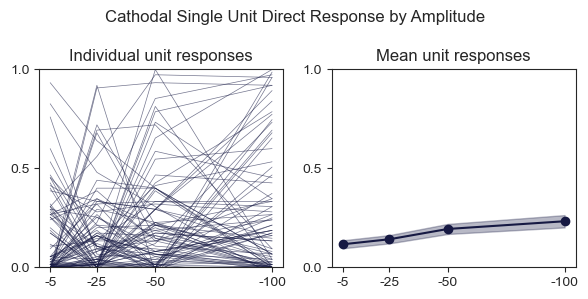

In [26]:
from scipy.stats import sem
import numpy as np
import matplotlib.pyplot as plt

# setup
cathodal_color = '#161943'
amplitudes = [-5, -25, -50, -100]
amplitudes_abs = np.abs(amplitudes)

# create unique IDs for each unit across recordings
cat_direct_df['unique_id'] = cat_direct_df['unit_id'] + '_' + cat_direct_df['recording']

# get only units that pass threshold at any amplitude
cat_ids = cat_direct_df[cat_direct_df['norm_prob'] > 0.15].unique_id.unique()

# initialize
norm_probs = []
valid_ids = []

# loop over IDs and collect norm_prob curves
for uid in cat_ids:
    unit_df = cat_direct_df[cat_direct_df['unique_id'] == uid]
    unit_df = unit_df.sort_values('amplitude', key=lambda x: np.abs(x))  # sort by abs amplitude
    
    if len(unit_df) == 4:
        norm_probs.append(unit_df['norm_prob'].values)
        valid_ids.append(uid)

# Convert to array
norm_probs = np.array(norm_probs)


fig, ax = plt.subplots(1, 2, figsize=(6, 3))

# Left plot: individual curves
for row in norm_probs:
    ax[0].plot(amplitudes_abs, row, lw=0.5, color=cathodal_color, alpha=0.6)

# Right plot: mean ± SEM
mean_vals = np.mean(norm_probs, axis=0)
sem_vals = sem(norm_probs, axis=0)

ax[1].plot(amplitudes_abs, mean_vals, marker='o', color=cathodal_color)
ax[1].fill_between(amplitudes_abs, mean_vals - sem_vals, mean_vals + sem_vals,
                   color=cathodal_color, alpha=0.3)

# Formatting
for a in ax:
    a.set_ylim(0, 1)
    a.set_xticks(amplitudes_abs, [str(a) for a in amplitudes])
    a.set_yticks([0, 0.5, 1])

ax[0].set_title('Individual unit responses')
ax[1].set_title('Mean unit responses')
plt.suptitle('Cathodal Single Unit Direct Response by Amplitude')
plt.tight_layout()



In [27]:
from statsmodels.formula.api import ols
import statsmodels.api as sm

# Create dataframe for stats from valid rows
amplitudes = [-5, -25, -50, -100]
amplitudes_abs = np.abs(amplitudes)

# Build a long-form DataFrame
unit_ids = []
amp_list = []
prob_list = []

for uid, probs in zip(valid_ids, norm_probs):
    for amp, prob in zip(amplitudes_abs, probs):
        unit_ids.append(uid)
        amp_list.append(amp)
        prob_list.append(prob)

anova_df = pd.DataFrame({
    'unit': unit_ids,
    'amplitude': amp_list,
    'norm_prob': prob_list
})

# Fit linear model: norm_prob ~ amplitude
model = ols('norm_prob ~ amplitude', data=anova_df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)


              sum_sq     df          F    PR(>F)
amplitude   0.774426    1.0  12.779023  0.000394
Residual   23.876932  394.0        NaN       NaN


# Figure 4 j, k -- clustering responders

## amplitude selectivity for cathodal polarity

In [28]:
cat_direct_df['unique_id'] = cat_direct_df['unit_id'] + '_' + cat_direct_df['recording']
# start with bipolar
cat_ids = cat_direct_df[cat_direct_df['norm_prob'] > 0.15].unique_id.unique()

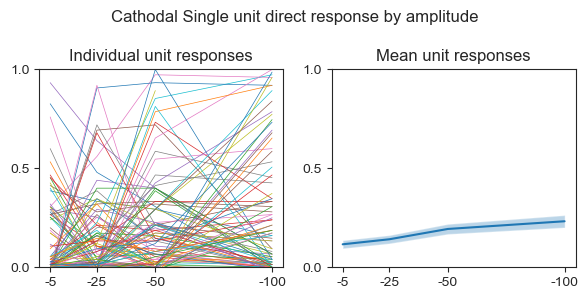

In [29]:
from scipy.stats import sem 
fig, ax = plt.subplots(1, 2, figsize = (6, 3))
ids = []
norm_probs = np.zeros((len(cat_ids), 4))
counter = 0
for i, id in enumerate(cat_ids):
    #print(bi_direct_df[bi_direct_df.unique_id == id].norm_prob.values)
    #print(bi_direct_df[bi_direct_df.unique_id == id].amplitude.values)
    norm_prob = cat_direct_df[cat_direct_df.unique_id == id].norm_prob.values
    ax[0].plot(np.abs(cat_direct_df[cat_direct_df.unique_id == id].amplitude.values), cat_direct_df[cat_direct_df.unique_id == id].norm_prob.values, lw = 0.5)
    if len(norm_prob) == 4:
       norm_probs[counter] = norm_prob
       ids.append(id)
       counter+=1
    else:
        norm_probs = np.delete(norm_probs, counter, axis=0)
    
mean_norm_probs = np.mean(norm_probs, axis = 0)
std_norm_probs = np.std(norm_probs, axis = 0)
sem_norm_probs = sem(norm_probs, axis = 0)

ax[1].plot(np.abs([-5,-25,-50,-100]), mean_norm_probs)
ax[1].fill_between(np.abs([-5,-25,-50,-100]), mean_norm_probs - sem_norm_probs, mean_norm_probs + sem_norm_probs, alpha = 0.3)
ax[1].set_ylim(0, 1)
ax[1].set_xticks([5, 25, 50, 100], ['-5', '-25', '-50', '-100'])
ax[0].set_ylim(0, 1)       
ax[0].set_xticks([5, 25, 50, 100], ['-5', '-25', '-50', '-100'])  
ax[0].set_yticks([0,  0.5, 1])
ax[1].set_yticks([0,  0.5, 1])

ax[0].set_title('Individual unit responses')
ax[1].set_title('Mean unit responses')

plt.suptitle('Cathodal Single unit direct response by amplitude')
plt.tight_layout()
#plt.savefig(r'C:\Users\jordan\Documents\combined_figs\single_unit\direct_response\2ms\cathodal_single_unit_response.png')
#plt.savefig(r'C:\Users\jordan\Documents\combined_figs\single_unit\direct_response\2ms\cathodal_single_unit_response.pdf')
    

C:\Users\jordan\AppData\Local\Temp\ipykernel_134792\1145661028.py:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 354x354 with 0 Axes>

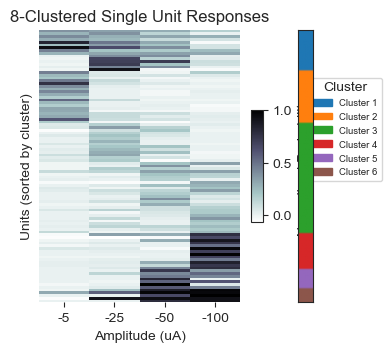

In [30]:

from scipy.cluster.hierarchy import linkage, fcluster

# --- 1. Hierarchical clustering and assign 8 clusters ---
amplitudes = [-5, -25, -50, -100]  # Define your amplitudes
Z = linkage(norm_probs, method='ward')
num_clusters = 6
cluster_labels = fcluster(Z, num_clusters, criterion='maxclust')  # shape: (n_units,)

# --- 2. Sort data by cluster assignments ---
sort_idx = np.argsort(cluster_labels)
sorted_norm_probs = norm_probs[sort_idx]
sorted_ids = np.array(ids)[sort_idx] if ids is not None else None
sorted_cluster_labels = cluster_labels[sort_idx]

# --- 3. Plot heatmap, colored by cluster along y-axis ---
fig = plt.figure(figsize=(3.54, 3.54))

import matplotlib.patches as mpatches
import matplotlib.colors as mcolors

unique_clusters = np.unique(sorted_cluster_labels)
palette = sns.color_palette("tab10", n_colors=len(unique_clusters))
cluster2color = {k: palette[i] for i, k in enumerate(unique_clusters)}
cluster_colors = [cluster2color[k] for k in sorted_cluster_labels]

fig = plt.figure(figsize=(3.54, 3.54))
gs = fig.add_gridspec(1, 2, width_ratios=[15, 1], wspace=0.3)

# Main heatmap with colorbar at the bottom
ax0 = fig.add_subplot(gs[0])
hm = sns.heatmap(
    sorted_norm_probs,
    cmap='bone_r',
    xticklabels=amplitudes,
    yticklabels=False,
    cbar=True,
    cbar_ax=None,
    ax=ax0
)

# Move the colorbar to the bottom
# Get the image object and manually add colorbar
cbar = hm.collections[0].colorbar
cbar.remove()
cb = fig.colorbar(
    hm.collections[0],
    ax=ax0,
    orientation='vertical',
    pad=0.05,  # adjust for spacing
    fraction=0.05,
    aspect = 10
)
cb.set_label("Normalized Probability")

ax0.set_xlabel('Amplitude (uA)')
ax0.set_ylabel('Units (sorted by cluster)')
ax0.set_title('8-Clustered Single Unit Responses')

# Cluster colorbar/sidebar
ax1 = fig.add_subplot(gs[1])
ax1.imshow(np.array(cluster_colors).reshape(-1, 1, 3), aspect='auto')
ax1.set_xticks([])
ax1.set_yticks([])

# Optionally add a legend for clusters (outside plot)
handles = [mpatches.Patch(color=cluster2color[k], label=f'Cluster {k}') for k in unique_clusters]
ax0.legend(handles=handles, title='Cluster', bbox_to_anchor=(1.1, 1), loc='upper left', borderaxespad=5, fontsize='x-small')

plt.tight_layout()
#plt.savefig(r'C:\Users\jordan\Documents\combined_figs\single_unit\direct_response\cathodal_clustered_heatmap_boneheatmap_6clusts.png')
#plt.savefig(r'C:\Users\jordan\Documents\combined_figs\single_unit\direct_response\cathodal_clustered_heatmap_boneheatmap_6clusts.pdf')

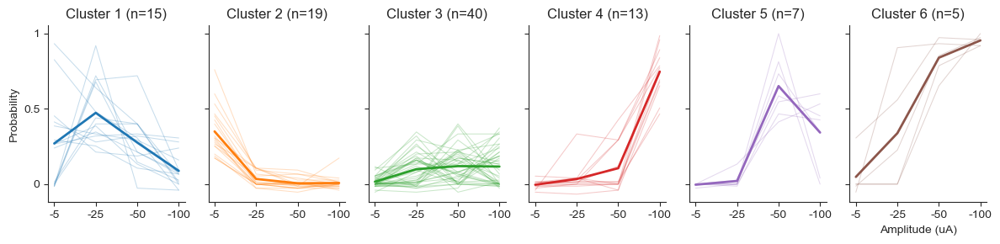

In [31]:
x = np.arange(len(amplitudes))
num_clusters = len(unique_clusters)

fig, axes = plt.subplots(
    nrows=1, ncols=num_clusters,
    figsize=(2 * num_clusters, 3),
    sharey=True
)

if num_clusters == 1:
    axes = [axes]

for i, k in enumerate(unique_clusters):
    ax = axes[i]
    idx = np.where(sorted_cluster_labels == k)[0]
    if len(idx) == 0:
        continue

    # Plot individual unit responses
    for row in sorted_norm_probs[idx]:
        ax.plot(x, row, color=cluster2color[k], alpha=0.25, lw=0.75, zorder=1)

    # Plot cluster mean
    mean_response = sorted_norm_probs[idx].mean(axis=0)
    ax.plot(x, mean_response, color=cluster2color[k], lw=2, label=f'Cluster {k}', zorder=2)

    ax.set_title(f'Cluster {k} (n={len(idx)})')
    ax.set_xticks(x)
    ax.set_xticklabels(amplitudes)
    ax.set_yticks([0, 0.5, 1], labels=[])

# Only leftmost axis has y-tick labels
axes[0].set_yticks([0, 0.5, 1], labels=['0', '0.5', '1'])
axes[0].set_ylabel('Probability')
axes[-1].set_xlabel('Amplitude (uA)')

# Journal-style: remove top/right spines
for ax in axes:
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.tight_layout()
#plt.savefig(r'C:\Users\jordan\Documents\combined_figs\single_unit\direct_response\cathodal_clustered_lineplots_6clusts.png')
#plt.savefig(r'C:\Users\jordan\Documents\combined_figs\single_unit\direct_response\cathodal_clustered_lineplots_6clusts.pdf')

## polarity specificity 

In [32]:
direct_df['unique_id'] = direct_df['unit_id'] + '_' + direct_df['recording']
# start with bipolar
ids = direct_df[direct_df['norm_prob'] > 0.15].unique_id.unique()

direct_df_resp = direct_df[direct_df['unique_id'].isin(ids)].copy()

pivot_df = (
    direct_df_resp
    .pivot_table(index='unique_id',
                 columns=['polarity', 'amplitude'],
                 values='norm_prob',
                 aggfunc='mean')            # multiple repeats → average
    .sort_index(axis=1, level=[0, 1])       # tidy ordering
)

In [ ]:
# average (or max, or area‑under‑curve) across amplitudes
pol_feat = (
    direct_df_resp
    .groupby(['unique_id', 'polarity'])['norm_prob']
    .max()                          # or .max()
    .unstack(fill_value=0.)          # → unique_id × polarity
)

# normalise each unit so shape, not magnitude, drives clustering
pol_feat = pol_feat.div(pol_feat.max(axis=1), axis=0).fillna(0.0)

from sklearn.cluster import AgglomerativeClustering
X = pol_feat.values
k = 6                           
labels = AgglomerativeClustering(n_clusters=k, linkage='ward').fit_predict(X)
pol_feat['cluster'] = labels


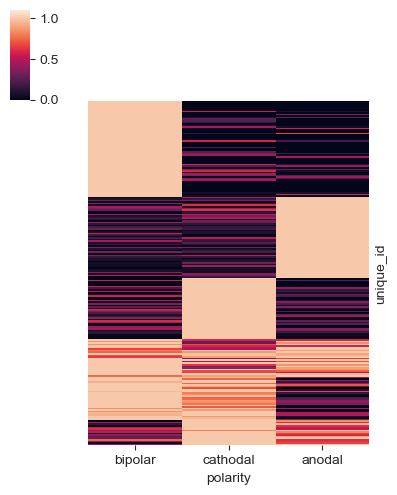

In [ ]:
# 1)  Re‑order the rows by cluster label (0 → 5)
# ------------------------------------------------------------------
ordered_idx = (
    pol_feat                      # (unique_id × polarity)
    .sort_values('cluster')      
    .index                        
)

plot_df = pol_feat.loc[ordered_idx, ['bipolar', 'cathodal', 'anodal']]


sns.clustermap(
    plot_df,                      
    row_cluster=False,            # custom order based on previous clustering
    col_cluster=False,            
    cmap='rocket',
    yticklabels=False,
    vmin=0, vmax=1.1,
    figsize = (4, 5)

)
save_path = r'C:\Users\jordan\Documents\combined_figs\single_unit\direct_response\2ms\polarity_clusters'
if not os.path.exists(save_path):
    os.makedirs(save_path)
#plt.savefig(os.path.join(save_path, 'polarity_clusters_heatmap.png'))
#plt.savefig(os.path.join(save_path, 'polarity_clusters_heatmap.pdf'))

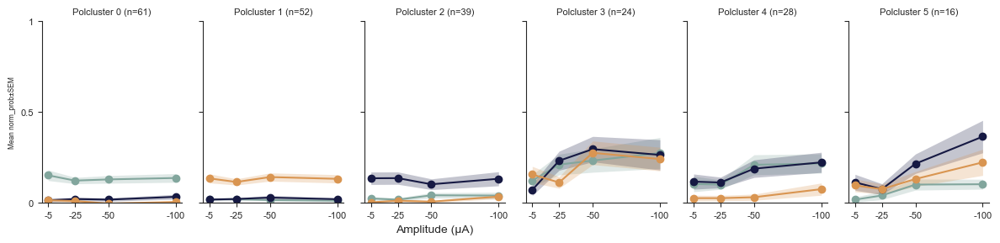

In [50]:
colors = {'bipolar': '#82A69D',
          'cathodal': '#161943',
          'anodal'  : '#D99551'}


fig, axes = plt.subplots(1, 6, figsize=(12, 3), sharex=True, sharey=True)

for c in np.sort(pol_feat['cluster'].unique()):
    ax = axes[c]
    # ----- units in this polarity‑cluster
    units = pol_feat.index[pol_feat['cluster'] == c]
    sub   = direct_df[direct_df['unique_id'].isin(units)].copy()

    sub['abs_amp'] = sub['amplitude'].abs()              # positive x‑axis

    # ----- mean and SEM of norm_prob
    g = sub.groupby(['abs_amp', 'polarity'])['norm_prob']
    mean_df = g.mean().unstack('polarity').sort_index()  # ascending amp
    sem_df  = g.sem().unstack('polarity').reindex(mean_df.index)

    for pol in ['bipolar', 'cathodal', 'anodal']:
        if pol in mean_df.columns:
            x = mean_df.index
            y = mean_df[pol]
            e = sem_df[pol]

            ax.plot(x, y, lw=1.5, marker='o', color=colors[pol], label=pol)
            ax.fill_between(x, y - e, y + e,
                            color=colors[pol], alpha=0.25, linewidth=0)

    axes[2].set_xlabel('Amplitude (µA)')
    axes[0].set_ylabel('Mean norm_prob±SEM', fontsize = 6)
    ax.set_title(f'Polcluster {c} (n={len(units)})', fontsize = 8)
    ax.set_ylim(0, 1)
    ax.set_yticks([0, 0.5, 1], ['0', '0.5', '1'], fontsize = 8)
    ax.set_xticks([5, 25, 50, 100], ['-5', '-25', '-50', '-100'], fontsize = 8)
    # ax.legend(frameon=False)          # uncomment if you want the legend
    sns.despine(ax=ax, top=True, right=True)  
plt.tight_layout()
save_path = r'C:\Users\jordan\Documents\combined_figs\single_unit\direct_response\2ms\polarity_clusters'
if not os.path.exists(save_path):
    os.makedirs(save_path)
#plt.savefig(os.path.join(save_path, 'polarity_clusters_mean_norm_prob.png'))
#plt.savefig(os.path.join(save_path, 'polarity_clusters_mean_norm_prob.pdf'))